<a href="https://colab.research.google.com/github/ThierryLi/0main_openSAP_repo/blob/master/Deep_Learning_School.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![UCA](http://univ-cotedazur.fr/fr/university/communication-presse/charte-et-logos/logo/png/uca-logo-ligne)
# **DEEP LEARNING SCHOOL - LAB SESSION**

## **Speech Recognition Using Deep learning**


#### Lab proposed by:


---




### Frederic PRECIOSO



Laboratoire I3S - Full Professor at Universite Cote d'Azur

frederic.precioso@unice.fr / 
[linkedin](https://www.linkedin.com/in/frédéric-precioso-3a37389) /
[web page](http://www.i3s.unice.fr/~precioso)



### Baptiste POUTHIER 
NXP Semiconductors - Voice & Audio TEC / Universite Cote d'Azur

baptiste.pouthier@gmail.com / 
[linkedin](https://www.linkedin.com/in/baptiste-pouthier)




### Federico UNGOLO 
NXP Semiconductors - Voice & Audio TEC / Universite Cote d'Azur

ungolo.federico@gmail.com /
[linkedin](https://www.linkedin.com/in/federico-ungolo )


# Introduction

Today, deep learning is the state-of-the-art technique used to do speech recognition. 


In this lab, we will experiment how deep learning works with audio signals ; more specifically, we will learn how to build and train some efficient deep learning models to recognize speech. 

This lab is composed of 4 parts:



*    **In the first part, we'll see how to process the data in order to use it for deep learning**

Beside descovering the classical strategies to prepare the data, we're going to use signal processing techniques to adapt the representation of the audio signals to deep learning.

*  **Secondly, we will build our first deep learning model**

More especially, we will create a convolutional neural network (CNN) to learn a representation of the previously processed data. Once the model trained, we will compute its performances and see how to enhance them by changing hyperparameters.


*   **We will try a more advanced approach wich is currently used by many state-of-the-art models**

We will discover how LSTM and their variants works. Again, we will see the performances of the model and we will compare them to the CNN.

*   **Last part is about going further : we will test the robustness of the models in noisy conditions**

The idea is to compare the accuracy of the predictions for multiple levels of noise.



---



 

To build our neural networks, we will use **Keras** which is one of the most used libraries for deep learning. It is capable of running on top of TensorFlow and has the advantage of being easy to handle and to understand, in addition to performing well.

There are two ways to build Keras models: **sequential** and **functional**.


1.   **The sequential API** allows you to create models layer-by-layer for most problems. It is limited in that it does not allow you to create models that share layers or have multiple inputs or outputs.

2.   Alternatively, **the functional API** allows you to create models that have a lot more flexibility as you can easily define models where layers connect to more than just the previous and next layers. In fact, you can connect layers to (literally) any other layer. As a result, creating complex networks such as siamese networks and residual networks become possible.

[More about the differences between sequential and functional APIs](https://jovianlin.io/keras-models-sequential-vs-functional/)

During this lab, we will use the two approches alternatively.

## Before starting to beat Google Home and Amazon Echo



**1.   Please run the following cells to have access to the lab ressources**



In [0]:
'''
the dataset, stored on gitlab, can be imported using one line (~2 minutes)
'''

! git clone https://gitlab.com/baptiste.pouthier/google-speech-dataset.git

Cloning into 'google-speech-dataset'...
remote: Enumerating objects: 64491, done.
remote: Counting objects: 100% (64491/64491), done.
remote: Compressing objects: 100% (64303/64303), done.
remote: Total 64491 (delta 209), reused 64448 (delta 187)
Receiving objects: 100% (64491/64491), 1.51 GiB | 23.52 MiB/s, done.
Resolving deltas: 100% (209/209), done.
Checking out files: 100% (64751/64751), done.


In [0]:
'''
install library which is not already installed
'''
!pip install sonopy

  Stored in directory: /root/.cache/pip/wheels/b6/39/ba/b2f21d4fbcb362658c73f83c9502782300b0399aef3693b506
Successfully built sonopy


In [0]:
'''
used libraries
'''
from IPython.display import Audio, Image
import os
import glob
import random
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy as np
from tqdm  import tqdm
from sonopy import mfcc_spec
from scipy.io import wavfile

**2.   The GPU**



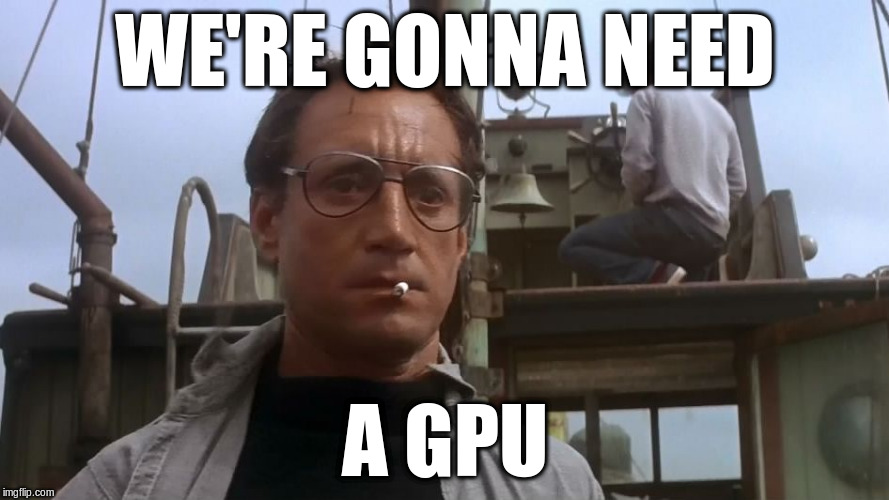

In [0]:
Image("google-speech-dataset/_lab_ressources_/need_a_gpu.jpg", width=500)

Google colab allows users to use GPU for free!

Using GPU is close to mandatory for machine learning (and especially for deep learning) as it's tremendously speeding up computations. 

To enable GPU backend in Google colab for your notebook:


1.   Runtime (top left corner) -> Change runtime type
2.   Put GPU as "Hardware accelerator"
3.   Save.
4.   Enjoy google's GPU!

# I. First step : the data





As all Machine Learning techniques, deep learning is **data centered**. Indeed, in order to train neural networks, we need to provide it a lot of training samples.

The [dataset](https://ai.googleblog.com/2017/08/launching-speech-commands-dataset.html) we'll use is the Speech Commands Dataset from Google. It has 65.000 one-second long utterances of 30 short words, spoken by thousands of different peoples.

## Collecting Data

You can see the different samples composing the dataset by clicking in the "Files" tab on the left. The data is in the "**google-speech-dataset**" directory. 

In [0]:
root_path = 'google-speech-dataset'
all_classes = os.listdir(root_path)
all_classes.remove('.git')
all_classes.remove('bird') #some outliers in dataset
all_classes.remove('_lab_ressources_')
all_classes.remove('_background_noise_')
print('all available classes:\n',all_classes)

all available classes:
 ['wow', 'go', 'left', 'seven', 'three', 'zero', 'right', 'no', 'yes', 'bed', 'six', 'dog', 'off', 'stop', 'five', 'up', 'cat', 'marvin', 'happy', 'house', 'tree', 'nine', 'four', 'sheila', 'one', 'down', 'eight', 'on', 'two']


**The goal of the lab is to create some models which are capable to recognise a word among the considred classes**. 

Let's (randomly) choose only 10 classes among all.

In [0]:
nb_classes = 10

chosen_classes = random.sample(all_classes, nb_classes)
print('chosen classes:',chosen_classes)

chosen classes: ['down', 'four', 'six', 'house', 'yes', 'stop', 'off', 'nine', 'seven', 'eight']


We want to collect the path of the .wav files, as well as their labels.

In [0]:
X = []
for label in chosen_classes:
  path = root_path+'/'+label
  X.extend(glob.glob(os.path.join(path, '*.wav')))
  
  
y = [path.split('/')[-2] for path in X]

In [0]:
print('data array length:',len(X))
print('label array length:',len(y))

print('X:',X)
print('y:',y)

data array length: 23057
label array length: 23057
X: ['google-speech-dataset/down/8e05039f_nohash_2.wav', 'google-speech-dataset/down/74551073_nohash_0.wav', 'google-speech-dataset/down/dea820ce_nohash_3.wav', 'google-speech-dataset/down/97f4c236_nohash_4.wav', 'google-speech-dataset/down/f8f60f59_nohash_2.wav', 'google-speech-dataset/down/c22d3f18_nohash_0.wav', 'google-speech-dataset/down/97f4c236_nohash_3.wav', 'google-speech-dataset/down/46a153d8_nohash_2.wav', 'google-speech-dataset/down/4a1e736b_nohash_2.wav', 'google-speech-dataset/down/9e075bf1_nohash_0.wav', 'google-speech-dataset/down/4a0e2c16_nohash_0.wav', 'google-speech-dataset/down/dcc012ec_nohash_0.wav', 'google-speech-dataset/down/60472d26_nohash_1.wav', 'google-speech-dataset/down/e0315cf6_nohash_3.wav', 'google-speech-dataset/down/a7dd45cf_nohash_0.wav', 'google-speech-dataset/down/01d22d03_nohash_0.wav', 'google-speech-dataset/down/d197e3ae_nohash_3.wav', 'google-speech-dataset/down/8dd24423_nohash_1.wav', 'google-s

In [0]:
'''
Listen to the audio files
'''

Audio(X[0]) #play with the index number to listen the samples!

## Transforming data

#### Encoding the labels

In [0]:
'''
change string labels into numbers
'''

le = preprocessing.LabelEncoder()
le.fit(y)
y = le.transform(y)



---


In order to test the model we'll build, we need to keep away some data to evaluate our network on unseen data.
We have to split our data to create a **"train"** part and a **"test"** part.
More specificly, in deep learning, we also separate a **"validation"** set to perform small tests during the training. This allow us to check that the network trains correctly.



In [0]:
'''
split in train / test / val
'''

X_train, X_test, y_train, y_test = train_test_split(X ,y , test_size=0.2, stratify=y)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, stratify=y_test)


print('training samples:',len(X_train))
print('testing samples:',len(X_test))
print('validation samples:',len(X_val))

training samples: 18445
testing samples: 2306
validation samples: 2306


#### Processing the audio: from waveform to MFCC
In this section, we will extract the data from the .wav files and transform it in order to use it in deep learning.



**In deep learning, we need to standardize the data in order to use it.**

We first **normalise** to have the same range of values for each of the inputs.

In [0]:
def normalize(audio_signal):
  
  return np.array(audio_signal)/max(np.absolute(audio_signal))

**All our samples have not the same length** ; in order to standardize the data, we will do **zero-padding**, i.e. adding some 0 before and after the signals which are too short. Thus, the signals will have the same length.

In [0]:
def add_padding(audio_signal,desired_len):
  
  length_signal = len(audio_signal)
  if length_signal < desired_len:
    zeros = list(np.zeros(desired_len - length_signal))
    cut = random.randint(0, len(zeros))
    left = zeros[:cut]
    right = zeros[cut:]

    audio_signal = left + list(audio_signal) + right
  
  return audio_signal

Now, we want to extract the waveforms (i.e. the numerical data) from the .wav files.

In [0]:
def get_signal(path):
  
  rate, sig = wavfile.read(filename=path)
  
  try:
    sig = sig[:, 0]
    
  except:
    pass
  
  
  #normalization
  sig = normalize(sig)

  #standardization of sizes
  sig = add_padding(sig,16000)
  
  return sig

In [0]:
'''
extract all the numerical arrays from the .wav files
'''

X_train_waveform = [get_signal(path) for path in tqdm(X_train,position=0)]
X_test_waveform = [get_signal(path) for path in tqdm(X_test,position=0)]
X_val_waveform = [get_signal(path) for path in tqdm(X_val,position=0)]

100%|██████████| 2306/2306 [00:04<00:00, 483.02it/s]


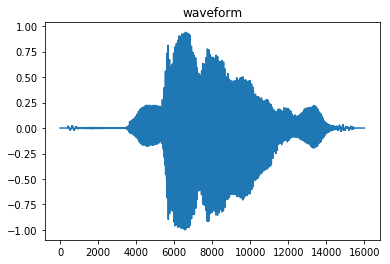

In [0]:
plt.figure()
plt.plot(X_train_waveform[0])
plt.title("waveform")
plt.show()



---



**MFCC features**

Extracting MFCC (**Mel Frequency Cepstral Coefficients**) features is a well known signal processing technique, especially used in **ASR** (Automatic Speech Recognition). These features are meant to represent the way humans perceive sound.

**1.   Frame the signal into short frames**

An audio signal is constantly changing, so to simplify things **we assume that on short time scales the audio signal doesn't change much** (when we say it doesn't change, we mean statistically i.e. statistically stationary, obviously the samples are constantly changing on even short time scales). **This is why we frame the signal into 20-40ms frames**. If the frame is much shorter we don't have enough samples to get a reliable spectral estimate, if it is longer the signal changes too much throughout the frame.

After slicing the signal into frames, we apply a window function such as the Hamming window to each frame. A Hamming window has the following form:

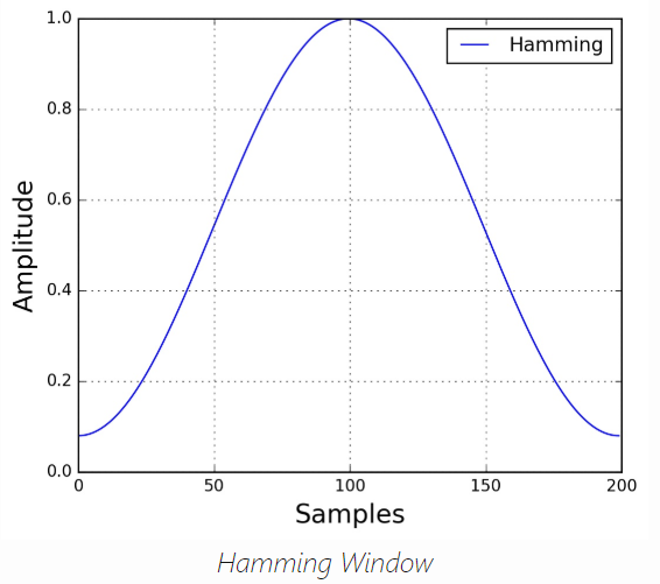

In [0]:
Image("google-speech-dataset/_lab_ressources_/hamming.png", width=400)

**2.   For each frame calculate the periodogram estimate of the power spectrum**

The next step is to calculate **the power spectrum of each frame**. This is motivated by the human cochlea (an organ in the ear) which vibrates at different spots depending on the frequency of the incoming sounds. Depending on the location in the cochlea that vibrates (which wobbles small hairs), different nerves fire informing the brain that certain frequencies are present. Our periodogram estimate performs a similar job for us, identifying which frequencies are present in the frame.

To compute the power spectrum P, we use the following equation:

$ P = \frac{\left | FFT(x_i) \right |^{2}}{N} $

where N is typically 256 or 512.

**3.   Apply  the mel filterbank to the power spectra, sum the energy in each filter**

The periodogram spectral estimate still contains a lot of information not required for Automatic Speech Recognition (ASR). In particular the cochlea can not discern the difference between two closely spaced frequencies. This effect becomes more pronounced as the frequencies increase. For this reason we take clumps of periodogram bins and sum them up to get an idea of how much energy exists in various frequency regions. This is performed by our **Mel filterbank**: the first filter is very narrow and gives an indication of how much energy exists near 0 Hertz. As the frequencies get higher our filters get wider as we become less concerned about variations. We are only interested in roughly how much energy occurs at each spot. The Mel scale tells us exactly how to space our filterbanks and how wide to make them.



Each filter in the filter bank is triangular having a response of 1 at the center frequency and decrease linearly towards 0 till it reaches the center frequencies of the two adjacent filters where the response is 0, as shown in this figure:

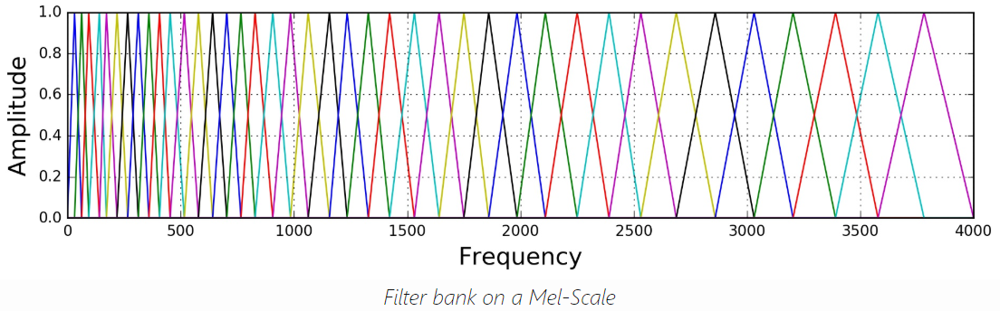

In [0]:
Image("google-speech-dataset/_lab_ressources_/melfilter.png",width=900)

The filters are modeled by the following equation:

$ H_m(k) =
  \begin{cases}
      \hfill 0                                      \hfill & k < f(m - 1) \\
      \\
      \hfill \dfrac{k - f(m - 1)}{f(m) - f(m - 1)}  \hfill & f(m - 1) \leq k < f(m) \\
      \\
      \hfill 1                                      \hfill & k = f(m) \\
      \\
      \hfill \dfrac{f(m + 1) - k}{f(m + 1) - f(m)}  \hfill & f(m) < k \leq f(m + 1) \\
      \\
      \hfill 0                                      \hfill & k > f(m + 1) \\
  \end{cases}
$


**4.   Take the logarithm of all filterbank energies**

**Once we have the filterbank energies, we take the logarithm of them.** This is also motivated by human hearing: we don't hear loudness on a linear scale. Generally to double the percieved volume of a sound we need to put 8 times as much energy into it. This means that large variations in energy may not sound all that different if the sound is loud to begin with. This compression operation makes our features match more closely what humans actually hear. Why the logarithm and not a cube root? The logarithm allows us to use cepstral mean subtraction, which is a channel normalisation technique.

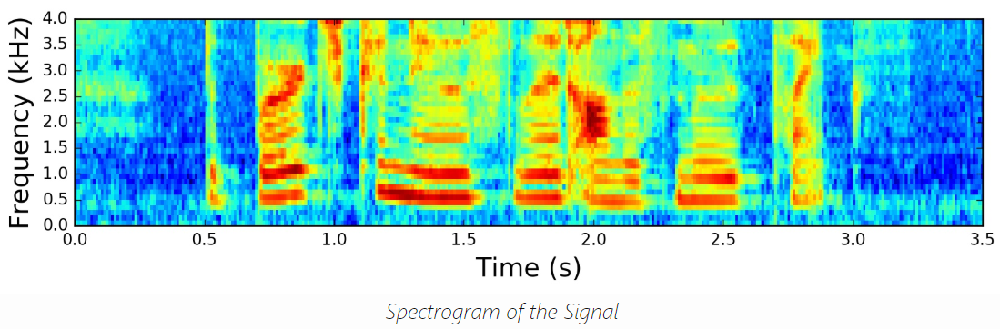

In [0]:
Image("google-speech-dataset/_lab_ressources_/spectrogram.png",width=900)

**5.   Take the DCT of the log filterbank energies**

The final step is to **compute the DCT of the log filterbank energies**. There are 2 main reasons this is performed. Because our filterbanks are all overlapping, the filterbank energies are quite correlated with each other. The DCT decorrelates the energies which means diagonal covariance matrices can be used to model the features in e.g. a HMM classifier. But notice that only 12 (2-13) of the 26 DCT coefficients are kept. This is because the higher DCT coefficients represent fast changes in the filterbank energies and it turns out that these fast changes actually degrade ASR performance, so we get a small improvement by dropping them.

The resulting features (12 numbers for each frame) are called **Mel Frequency Cepstral Coefficients (MFCC)**.




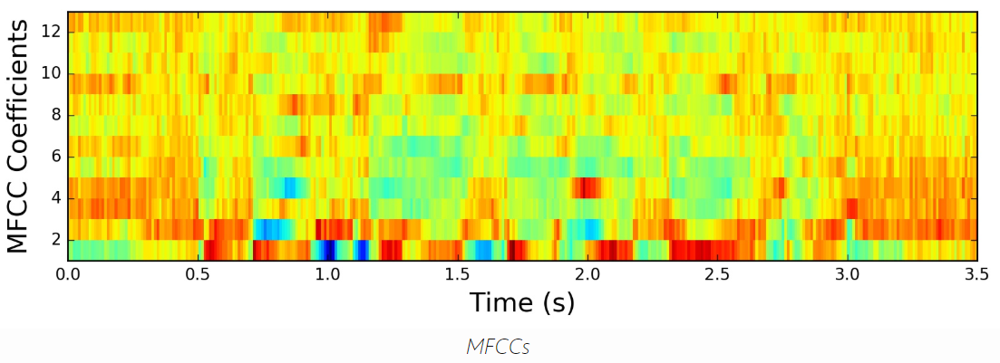

In [0]:
Image("google-speech-dataset/_lab_ressources_/mfcc.png",width=900)

* **Hint 1**: it's also possible to use the Deltas and the Delta-Deltas

*The MFCC feature vector describes only the power spectral envelope of a single frame, but it seems like speech would also have information in the dynamics i.e. what are the trajectories of the MFCC coefficients over time. It turns out that calculating the MFCC trajectories and appending them to the original feature vector increases ASR performance by quite a bit (if we have 12 MFCC coefficients, we would also get 12 delta coefficients, which would combine to give a feature vector of length 24).*

* **Hint 2**: feel free to play with MFCC parameters

*For example, you can take more than 12 coeffiecients and refine the extracted features. It's also common to mean-normalize the spectrum and improve the Signal-to-Noise Ratio (SNR)*



---


**Sources** (For more details, we strongly invite you to see these excellent articles!)

[guide-mel-frequency-cepstral-coefficients-mfccs](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/)

[speech-processing-for-machine-learning](https://haythamfayek.com/2016/04/21/speech-processing-for-machine-learning.html)



---



What about the code ?

In python, it exists multiple libraries which compute the MFCCs with one line.

In [0]:
def get_mfcc_from_signal(signal):

  #extract MFCCs features
  single_mfcc = mfcc_spec(signal, 16000, window_stride=(400, 160), fft_size=512, num_filt=20, num_coeffs=13).T

  #dropping first coefficient
  single_mfcc = single_mfcc[1:,:] #keeping only 12 coefficients

  return single_mfcc

In [0]:
'''
extract mfcc features from the waveforms
'''

X_train_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_train_waveform,position=0)]
X_test_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_test_waveform,position=0)]
X_val_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_val_waveform,position=0)]

100%|██████████| 2306/2306 [00:04<00:00, 547.20it/s]


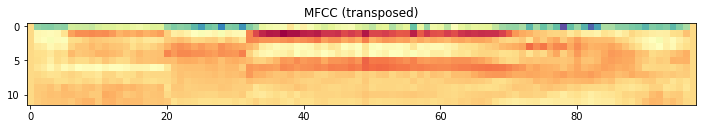

shape (transposed): (12, 98)


In [0]:
plt.figure(figsize=(12,4))
plt.imshow(X_train_mfcc[0],cmap='Spectral')
plt.title("MFCC (transposed)")
plt.show()

print('shape (transposed):',np.array(X_train_mfcc[0]).shape)

# II. First approach : From Multilayer Perceptron (MLP) To Convolutional Neural Network (CNN)




## Short introduction to MultiLayer Perceptron (MLP)



Before introducing CNN  and building our model, we need to mention the most simple neural network structure, called  "**MultiLayer Perceptron**".


### A bit of biology

As the name suggests, **the neural networks are inspired by the biology of the brain**. Inside such brains,  some receptors (acting as sensors which generate data) are feeding a collection of neurons that will extract informations. The external stimulus to the neurons not always make the neurons fire in the brain, thus requiring a relevant magnitude for a single event or a good timing for sequential stimulus of lower power.

All these basic concepts have been considered when theorizing the structure of the neural networks. High inputs are likely to make the neurons fire compared to the lower ones. However, the artificial neuron is **a very simplified version** of the biological neuron.

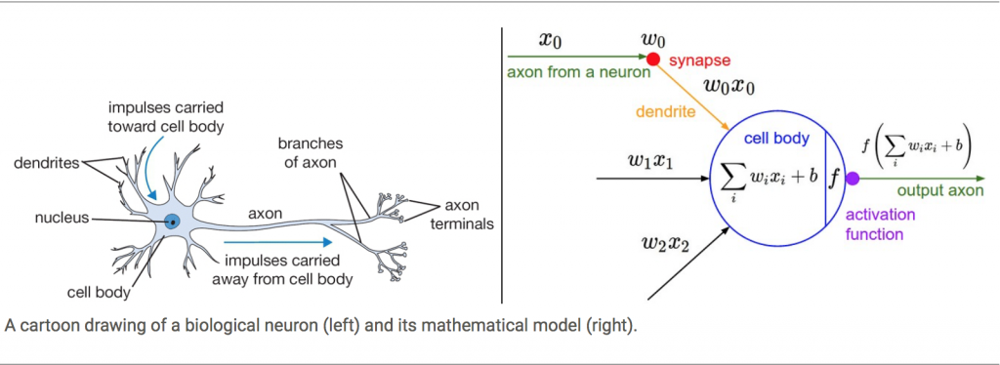

In [0]:
Image("google-speech-dataset/_lab_ressources_/neurone-artificiel-en-detail.png",width=1000)

### Neural network concept

*What are these neurons? And how are they connected?*

A neuron is nothing more than an object holding a number. These are grouped in layers, and the connections occurs between neurons of different layers. The main idea is to pass a vector of numbers (our input) to a set of layers of neurons and make them evolve in order to fit it to our problem. 
 
The input can be a flattened image, an audio waveform, a texte, a numerical arrays... 

In the following animations, we will consider a digit image.

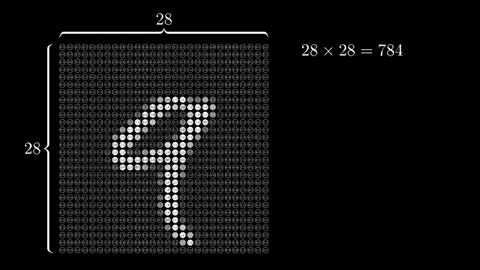

In [0]:
with open("google-speech-dataset/_lab_ressources_/cnn_flatten.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))

Let's have a closer look at the single computation behind one single neuron (or **perceptron**). Every single neuron from the previous layer is connected to this single neuron. **Therefore, the number held by the neuron it's the result of the linear combination between all the neurons values of the previous layer (white elements in the equation below) and their connection weight (in blue) to be finally adjusted by a term called bias (in pink).**

**This number is fed into an activation function (yellow sigma in the animation below) that will scale it,** amplifying the sum based on its relevancy. Depending on the problem we can use different activation functions (more below).


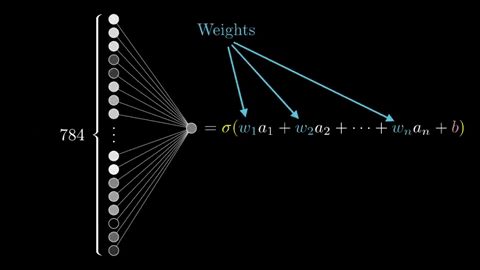

In [0]:
with open("google-speech-dataset/_lab_ressources_/neuron.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))

The process described above is repeted **for each neuron of each layer**. As shown in the following animation, we can stack multiple layers to create deep architectures. These layers are called "fully connected layers". Usually deeper architectures perform better with more complex problems; however, a high number of parameters can lead to optimization problems while increasing the time and resources for the training. 

**Note**: intermediate layers which are between the first and the last layer are called "**hidden layers**".

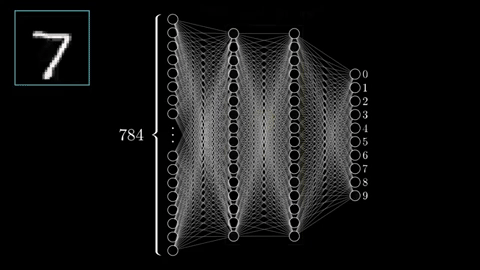

In [0]:
with open("google-speech-dataset/_lab_ressources_/forward.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))

**More about fully connected layers**

Fully connected layers (also called **dense layers**) connect every neuron in one layer to every neuron in another layer. It is in principle the same layer as the layers which compose the MLP explained above.

**What is the output layer**

The output layer is the very **last fully connected layer of a network**.This layer basically takes an input volume (the output of the layer preceding it) and outputs an N dimensional vector where N is the number of classes that the program has to choose from. For example, if you wanted a digit classification program like here, N would be 10 since there are 10 digits. Each number in this N dimensional vector represents the probability of a certain class.

Most of the time (but not always), we're using a **softmax** as activation function for this last layer: 

If the resulting vector for a digit classification program is [0,  0.1,  0.1,  0.75,  0,  0, 0,  0,  0,  0.05], then this represents a 10% probability that the image is a 1, a 10% probability that the image is a 2, a 75% probability that the image is a 3, and a 5% probability that the image is a 9.


**Let's build our first neural network, more precisely a MLP which take the audio waveforms as input.**

In [0]:
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential

'''
Here, we're using the sequential API.
'''

model_mlp = Sequential(name='MLP model') #create a model as a sequential model

model_mlp.add(Dense(128,input_shape=(16000,))) #adding our first fully connected layer with 128 neurons (as it's the first layer, we have to precise the input shape)

model_mlp.add(Dense(128)) #adding a second fully connected layer with again 128 neurons

model_mlp.add(Dense(nb_classes,activation='softmax')) #adding the output layer, which is a fully connected again with as many neurons as our number of classes and a softmax activation function

model_mlp.summary() #this line displays the topology (architecture) of the network

W0714 22:42:06.937614 140538355222400 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


Model: "MLP model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               2048128   
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
Total params: 2,065,930
Trainable params: 2,065,930
Non-trainable params: 0
_________________________________________________________________


### Train a neural network

One major thing about neural network is the **training step**. The goal is to update the parameters (weights and bias) of the whole architecture according to seen examples (training samples). Once a sample went through the network, we measure the inconsistency between the predicted value and the actual label by a function called "**loss function**". **It's a function of internal parameters of model (i.e weights and bias)**. 

For accurate predictions, one needs to minimize the calculated error. In a neural network, this is done using **back propagation**: the current error is typically propagated backwards to a previous layer, where it is used to modify the weights and bias in such a way that the error is minimized. This minimization and therefore the modification of the parameters is made using **gradient descent**.

The following GIF illustrates the back propagaption, i.e. the recursive update of the parameters using previous layer.

Intuitively, **the training phase leads to update each layer in order to discriminate more and more the features that compose the samples**. Each intermediate layer (**hidden layer**) learn a new representation based on its previous one. Then the last one learns how to interpret this representation to assign a label to the sample.


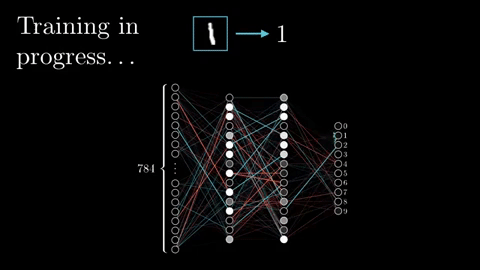

In [0]:
with open("google-speech-dataset/_lab_ressources_/training.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))

Let's train our previously created network:

Keras needs to have one-hot encoded labels. For example, the "a" label among {"a","b","c"} classes is encoded as [1,0,0].

We also need the data as numpy arrays.

In [0]:
y_train = np.eye(len(chosen_classes),dtype='uint8')[y_train]
print('train labels shape:',y_train.shape)

y_val = np.eye(len(chosen_classes),dtype='uint8')[y_val]
print('validation labels shape:',y_val.shape)

X_train_waveform = np.array(X_train_waveform)
X_test_waveform = np.array(X_test_waveform)
X_val_waveform = np.array(X_val_waveform)

train labels shape: (18445, 10)
validation labels shape: (2306, 10)


In [0]:
model_mlp.compile(loss='categorical_crossentropy', optimizer ='adam', metrics=['accuracy'])

model_mlp.fit(X_train_waveform, y_train, validation_data = (X_val_waveform, y_val), batch_size=32, epochs=10, shuffle=True, verbose=1)

Train on 18445 samples, validate on 2306 samples
Epoch 1/10
18445/18445 [==============================] - 4s 217us/sample - loss: 2.3939 - acc: 0.1129 - val_loss: 2.3577 - val_acc: 0.1054
Epoch 2/10
18445/18445 [==============================] - 3s 174us/sample - loss: 2.3310 - acc: 0.1700 - val_loss: 2.3946 - val_acc: 0.1188
Epoch 3/10
18445/18445 [==============================] - 3s 174us/sample - loss: 2.1985 - acc: 0.2558 - val_loss: 2.5391 - val_acc: 0.1275
Epoch 4/10
18445/18445 [==============================] - 3s 173us/sample - loss: 2.0555 - acc: 0.3315 - val_loss: 2.6131 - val_acc: 0.1362
Epoch 5/10
18445/18445 [==============================] - 3s 173us/sample - loss: 1.9279 - acc: 0.3776 - val_loss: 2.7059 - val_acc: 0.1388
Epoch 6/10
18445/18445 [==============================] - 3s 174us/sample - loss: 1.8337 - acc: 0.4168 - val_loss: 2.7905 - val_acc: 0.1357
Epoch 7/10
18445/18445 [==============================] - 3s 172us/sample - loss: 1.7285 - acc: 0.4519 - val_lo

Done! We trained the MLP, but as you can see, our results are not looking so good...

### Test a neural network

Once trained, the network has to be evaluated. We use train samples to calculate the accuracy of our network. During this step, the weights stay unchanged. This step is mendatory to make sure that the model is not overfitted and generalizes well the problem. 

**Overfitting** refers to a model that models the training data too well; it happens when a model learns the detail and noise in the training data to the extent that it negatively impacts the performance of the model on new data. This means that the noise or random fluctuations in the training data is picked up and learned as concepts by the model.



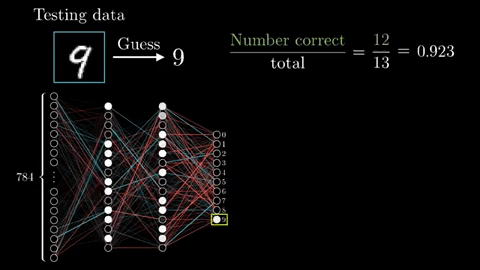

In [0]:
with open("google-speech-dataset/_lab_ressources_/testing.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))

We can test our newly built network:

In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_mlp.evaluate(X_test_waveform, np.eye(len(chosen_classes),dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 0s 173us/sample - loss: 3.2073 - acc: 0.1418
model accuracy: 0.141804


**The result is not so good... let's try to improve it a bit!**



### About Dropout & Activation Functions

*   **Dropout**

Simply put, **dropout refers to ignoring units (i.e. neurons) during the training phase** of certain set of neurons which is **chosen at random**. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

In the animation below, you can see the difference without dropout (left) and with (right).

*Why use dropout ?*
A fully connected layer occupies most of the parameters, and hence, **neurons develop co-dependency amongst each other during training** which curbs the individual power of each neuron leading to **overfitting** of training data.






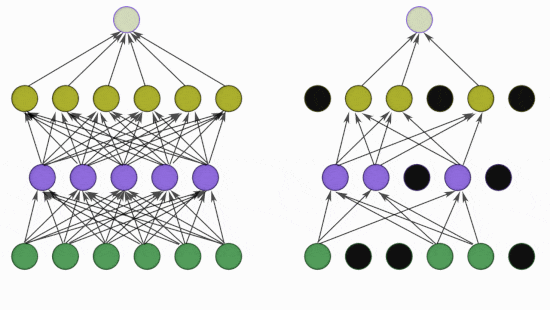

In [0]:
with open("google-speech-dataset/_lab_ressources_/dropout.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))


*   **Activation functions**

We often add **activation functions**, which are sometimes essential to ensure the convergence of the model.
The input values are passed through a function that squashes the value into a range. Here’s a bunch of common ones:


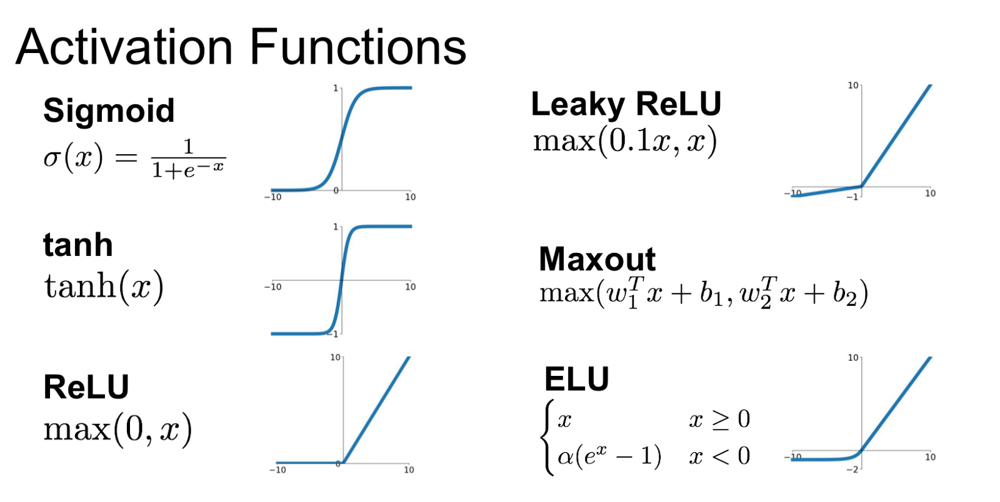

In [0]:
Image("google-speech-dataset/_lab_ressources_/activation.png",width=700)

**Let's add dropout and activation functions to the network!**

In [0]:
from tensorflow.keras. layers import Dropout

#create a model as a sequential model
model_mlp_dropout_activation = Sequential(name='MLP model with dropout and activation functions') 

#adding our first fully connected layer with 128 neurons (as it's the first layer, we have to precise the input shape)
#we're putting also a 'relu' activation function
model_mlp_dropout_activation.add(Dense(128, activation = 'relu', input_shape=(16000,))) 

#adding dropout
model_mlp_dropout_activation.add(Dropout(0.2))

#adding a second fully connected layer with again 128 neurons and a relu
model_mlp_dropout_activation.add(Dense(128, activation = 'relu'))

#adding the output layer, which is a fully connected again with as many neurons as our number of classes and a softmax activation function
model_mlp_dropout_activation.add(Dense(nb_classes,activation='softmax'))

#this line display the topology (architecture) of the network
model_mlp_dropout_activation.summary()

Model: "MLP model with dropout and activation functions"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 128)               2048128   
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               16512     
_________________________________________________________________
dense_5 (Dense)              (None, 10)                1290      
Total params: 2,065,930
Trainable params: 2,065,930
Non-trainable params: 0
_________________________________________________________________


In [0]:
model_mlp_dropout_activation.compile(loss='categorical_crossentropy', optimizer ='adam', metrics=['accuracy'])

model_mlp_dropout_activation.fit(X_train_waveform, y_train, validation_data = (X_val_waveform, y_val), batch_size=32, epochs=10, shuffle=True, verbose=2)

Train on 18445 samples, validate on 2306 samples
Epoch 1/10
18445/18445 - 3s - loss: 2.3016 - acc: 0.1450 - val_loss: 2.2607 - val_acc: 0.1917
Epoch 2/10
18445/18445 - 3s - loss: 1.9562 - acc: 0.3394 - val_loss: 2.2474 - val_acc: 0.1964
Epoch 3/10
18445/18445 - 3s - loss: 1.4965 - acc: 0.5173 - val_loss: 2.3913 - val_acc: 0.2051
Epoch 4/10
18445/18445 - 3s - loss: 1.1291 - acc: 0.6542 - val_loss: 2.5586 - val_acc: 0.2029
Epoch 5/10
18445/18445 - 3s - loss: 0.8189 - acc: 0.7516 - val_loss: 2.8341 - val_acc: 0.2121
Epoch 6/10
18445/18445 - 3s - loss: 0.6750 - acc: 0.8002 - val_loss: 3.0643 - val_acc: 0.2077
Epoch 7/10
18445/18445 - 3s - loss: 0.5655 - acc: 0.8343 - val_loss: 3.3131 - val_acc: 0.2042
Epoch 8/10
18445/18445 - 3s - loss: 0.4995 - acc: 0.8525 - val_loss: 3.5129 - val_acc: 0.1912
Epoch 9/10
18445/18445 - 3s - loss: 0.4438 - acc: 0.8685 - val_loss: 3.6265 - val_acc: 0.2016
Epoch 10/10
18445/18445 - 3s - loss: 0.3888 - acc: 0.8845 - val_loss: 3.7736 - val_acc: 0.2103


In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_mlp_dropout_activation.evaluate(X_test_waveform, np.eye(len(chosen_classes),dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 0s 127us/sample - loss: 3.6306 - acc: 0.2346
model accuracy: 0.23460537


**We improved our accuracy! But that's not enough to beat Google Home's performance... And by far!**



---



**Sources** (For more details, we strongly invite you to see these excellent videos and articles!)

[neural-networks](https://www.3blue1brown.com/neural-networks)

[loss-functions-and-optimization-algorithms](https://medium.com/data-science-group-iitr/loss-functions-and-optimization-algorithms-demystified-bb92daff331c)

[verfitting-and-underfitting](https://machinelearningmastery.com/overfitting-and-underfitting-with-machine-learning-algorithms/)



---



## What about CNN ?

Derived from the MLP, a convolutional neural network (CNN) is a type of artificial neural network that is specifically designed to process **pixel data**.  The layers of a CNN consist of an **input layer**, an **output layer** and **hidden layers** that can include **convolutional layers**, **pooling layers**, **fully connected layers** and **normalization layers**. It exists a lot of techniques to optimize CNN, like for example the dropout.



*   **Input layer**

The input of a Convolutional Neural Network is a matrix, which is most of the time a pixelated data (an image). Different CNN architectures can be built according to the different data type (RGB / grayscale images, video, ...). 

Therefore, we will now use the previously extracted MFCCs as input; besides describing speech very efficiently, it suits very well the use of CNNs as it is a matrix.


*   **Convolutional layer**

The convolution layer is about **sliding small filters** through the whole input to perform **element wise multiplication** in order to capture the most striking features.

The animation below represents the principle of convolution ; the created matrix, on the right, is called feature map. It is generated from the input matrix by sliding a filter and by computing element wise multiplication. As we're using **a multitude of filters to match a multitude of pattern**, a convolutional layer outputs multiple feature maps: the convolution output depth is equal to the quantity of applied filters. The deeper the convolutional layers, the more detailed are the features identified by the activation map.

As you can see in the following GIF, the created feature map has the same dimensions as the input matrix because of some added zeros.This technique called **padding** is not mandatory but can be very usefull to avoid decreasing too much the matrix dimension. The way the filter is sliding is conditioned by another parameter called "**stride**".

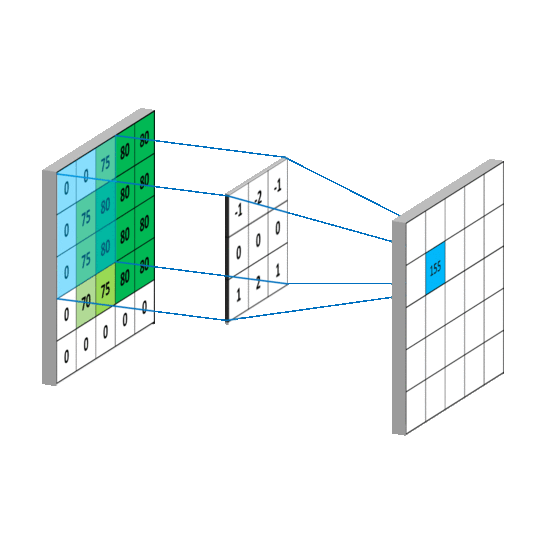

In [0]:
with open("google-speech-dataset/_lab_ressources_/conv.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))


*   **Pooling layers**

Pooling works very much like convoluting, where we take a kernel and move the kernel over the image, the only difference is the function that is applied to the kernel.

**Max pooling** and **Average pooling** are the most common pooling functions. Max pooling takes the largest value from the window of the image currently covered by the kernel, while average pooling takes the average of all values in the window.

This is done to in part to **help over-fitting** by providing an abstracted form of the representation. As well, it reduces the computational cost by **reducing the number of parameters** to learn and provides basic translation invariance to the internal representation.

Animation below is representing "max pooling".

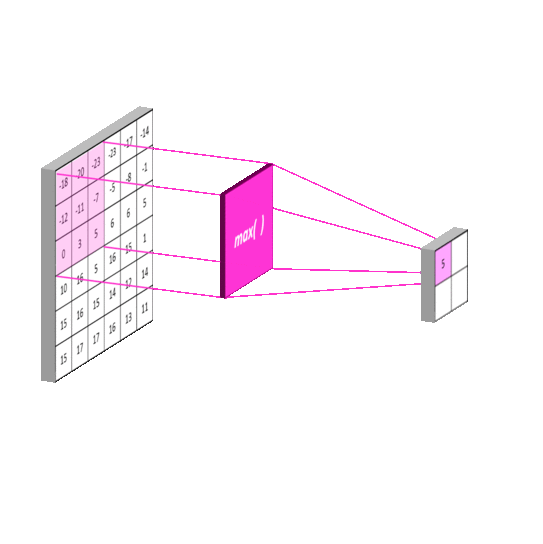

In [0]:
with open("google-speech-dataset/_lab_ressources_/pooling.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))



*   **Nornalization layers**

It is common to normalize the input by scaling the samples before training. If the input layer is benefiting from it, why not do the same thing also for the values in the hidden layers, that are changing all the time ? 

Using normalization layers, we can use higher learning rates because batch normalization makes sure that there’s no activation that’s gone really high or really low. And by that, things that previously couldn’t get to train, it will start to train.
It reduces overfitting because it has a slight regularization effects. Similar to dropout, it adds some noise to each hidden layer’s activations. Therefore, if we use batch normalization, we will use less dropout, which is a good thing because we are not going to lose a lot of information. However, we should not depend only on batch normalization for regularization; we should better use it together with dropout.






---


**Source** (For more details, we strongly invite you to read these excellent articles!)

[Guide-To-Understanding-Convolutional-Neural-Networks](https://adeshpande3.github.io/A-Beginner%27s-Guide-To-Understanding-Convolutional-Neural-Networks/)

[visualizing-parts-of-convolutional-neural-networks](https://hackernoon.com/visualizing-parts-of-convolutional-neural-networks-using-keras-and-cats-5cc01b214e59)

[understanding-convnets-cnn](https://medium.com/neuronio/understanding-convnets-cnn-712f2afe4dd3)

[batch-normalization](https://towardsdatascience.com/batch-normalization-in-neural-networks-1ac91516821c)

[learning-less-to-learn-better](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)


---



## Building the network


We will create the following achitecture which is detailed in this [paper](http://cs229.stanford.edu/proj2017/final-reports/5244201.pdf?fbclid=IwAR0SUKEuBxzFBIeLKsfUq0f77O_NzLVTN0rHATPiQQ8whK7D1zGVhY41ajU).

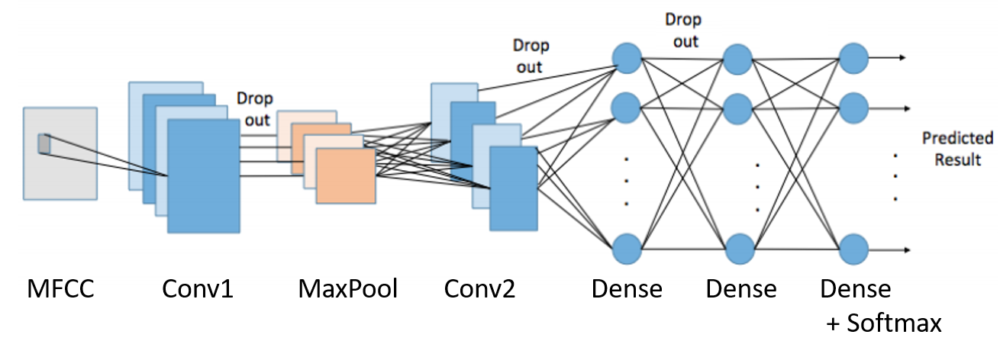

In [0]:
Image("google-speech-dataset/_lab_ressources_/cnn_topology.png",width=900)

This network is composed by two convolutional layers and three dense layers



*   To feed the data to a CNN, we need to shape it as required by Keras. As input, a 2D convolutional layer needs a **4D tensor** with shape: **(batch, rows, cols, channels)**. Therefore, we need to precise the "channels" axis, which can be seen as the number of level of color of each input. In our case, we have a 1 dimensional channel.

  **Hint:** if we were working with RGB images, we would have 3D channel.


In [0]:
'''
Adding the channel dimension
'''

X_train_mfcc_expanded = np.expand_dims(X_train_mfcc, axis=-1)
print('train tensor shape:',X_train_mfcc_expanded.shape)

X_val_mfcc_expanded = np.expand_dims(X_val_mfcc, axis=-1)
print('validation tensor shape:',X_val_mfcc_expanded.shape)

X_test_mfcc_expanded = np.expand_dims(X_test_mfcc, axis=-1)
print('test tensor shape:',X_test_mfcc_expanded.shape)

nb_classes = len(chosen_classes)

train tensor shape: (18445, 12, 98, 1)
validation tensor shape: (2306, 12, 98, 1)
test tensor shape: (2306, 12, 98, 1)


We will now define the model.


In [0]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model


'''
Here, we will use the functional API.
Using Functional API, we have to build each layer with indicating its previous one
'''

def CNN():
  #We first define the input shape
  mfcc = Input(shape=(12,98,1)) 

  #We build the first convolutional layer and feed it the previously defined Input
  conv_1 = Conv2D(filters=32, kernel_size=(8,15), strides=(1,1), activation= None, padding='same')(mfcc)

  #We add a normalization layer and feed it the convolution
  norm_1 = BatchNormalization()(conv_1)

  #We add activation layer (relu) after the normalization layer
  activ_1 = Activation('relu')(norm_1)

  #we add dropout
  dropout_1 = Dropout(rate=0.1)(activ_1)

  #Max pooling layer
  max_pool = MaxPool2D(pool_size=(2, 2))(dropout_1)

  #Second convolution
  conv_2 = Conv2D(filters=32, kernel_size=(4,10),strides=(1,1), activation= None,padding='same')(max_pool)

  #Normalization again
  norm_2 = BatchNormalization()(conv_2)

  #Activation function (relu)
  activ_2 = Activation('relu')(norm_2)

  #Dropout
  dropout_2 = Dropout(rate=0.1)(activ_2)

  # Flattening a tensor means to remove all of the dimensions except for one. This is exactly what the Flatten layer do.
  # A flatten operation on a tensor reshapes the tensor to have the shape that is equal to the number of elements contained in tensor non including the batch dimension.
  # See summary bellow to see the change of the shape
  reshape = Flatten()(dropout_2)


  # dense layer, same as the one used in MLP
  dense_1 = Dense(128, activation = 'relu')(reshape)

  # dropout, sane as the dropout used in MLP
  dropout_3 = Dropout(rate = 0.2)(dense_1)

  # dense layer, same as the one used in MLP
  dense_2 = Dense(128, activation = 'relu')(dropout_3)

  # dense layer, same as the one used in MLP
  output = Dense(nb_classes, activation = 'softmax')(dense_2)

  # The line bellow create the model composed by all the layers previously created
  # It quite like assembling the puzzle pieces!
  modell = Model(inputs = mfcc, outputs = output)

  return modell

model_cnn = CNN()

model_cnn.compile(loss='categorical_crossentropy',
              optimizer = Adam(lr=0.003),metrics=['accuracy'])

model_cnn.summary() #this command is very handfull: it displays the topology of the network and the number of parameters

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 12, 98, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 12, 98, 32)        3872      
_________________________________________________________________
batch_normalization (BatchNo (None, 12, 98, 32)        128       
_________________________________________________________________
activation (Activation)      (None, 12, 98, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 12, 98, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 6, 49, 32)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 6, 49, 32)         40992 

## Training

In [0]:
'''
training
'''

history_cnn = model_cnn.fit(X_train_mfcc_expanded,y_train,validation_data = (X_val_mfcc_expanded, y_val),batch_size=32, epochs=10, shuffle=True)

Train on 18445 samples, validate on 2306 samples
Epoch 1/10
18445/18445 [==============================] - 7s 366us/sample - loss: 1.2969 - acc: 0.5603 - val_loss: 0.6797 - val_acc: 0.7949
Epoch 2/10
18445/18445 [==============================] - 4s 216us/sample - loss: 0.5838 - acc: 0.8118 - val_loss: 0.4720 - val_acc: 0.8504
Epoch 3/10
18445/18445 [==============================] - 4s 219us/sample - loss: 0.3791 - acc: 0.8782 - val_loss: 0.2636 - val_acc: 0.9111
Epoch 4/10
18445/18445 [==============================] - 4s 226us/sample - loss: 0.2896 - acc: 0.9066 - val_loss: 0.2202 - val_acc: 0.9345
Epoch 5/10
18445/18445 [==============================] - 4s 224us/sample - loss: 0.2438 - acc: 0.9207 - val_loss: 0.1931 - val_acc: 0.9389
Epoch 6/10
18445/18445 [==============================] - 4s 225us/sample - loss: 0.2126 - acc: 0.9308 - val_loss: 0.2451 - val_acc: 0.9224
Epoch 7/10
18445/18445 [==============================] - 4s 221us/sample - loss: 0.1899 - acc: 0.9419 - val_lo

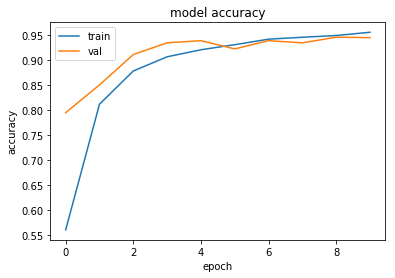

In [0]:
def plot_history(history):
  plt.plot(history.history['acc'])
  plt.plot(history.history['val_acc'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()
  
plot_history(history_cnn)

Notice how the validation accuracy starts with higher values at the beginning of the training and being overtaken after few epochs by the training accuracy. Conceptually this makes little sense: the network has poor performance in learning but higher in validating the data. This phenomenon is due to possible reasons. The first one is the presence of the Dropout rate. By lighting off some of the network connections, the network has limited capabilities during the training but when validating the data, all the connections contribute resulting in a higher performance. The second reason is related to the nature of the data used for the training. Let's suppose that our network reached an overall accuracy in the training phase of 40% and a validation accuracy of 50%. It could happen that 40% is enough to generalize the features used to discriminate the data.

This behaviour at the beginning of the training can also be an alert of the possible overfitting for large number of epochs. Having a training curve that reaches its plateau at a considerably slower pace than the valitation one could mean that the generalization is effectively happening only in the first stages of training while for the later epochs the model is focusing more on the data itself instead of its generalization.

## Testing



In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_cnn.evaluate(X_test_mfcc_expanded, np.eye(len(chosen_classes),dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 0s 88us/sample - loss: 0.1941 - acc: 0.9419
model accuracy: 0.9418907


In order to analyse the results we have obtained, we can use a very common technique which is the **confusion matrix**. It's very usefull to evaluate the quality of the output of a classifier. The diagonal elements represent the number of points for which the predicted label is equal to the true label, while off-diagonal elements are those that are mislabeled by the classifier. **The higher the diagonal values of the confusion matrix the better**, indicating many correct predictions.

If M if the confusion matrix, the element M[i,j] is equal to the number of observations known to be in group i but predicted to be in group j. We will normalize this matrix so that it is more meaningful.

2306/2306 [==============================] - 0s 78us/sample


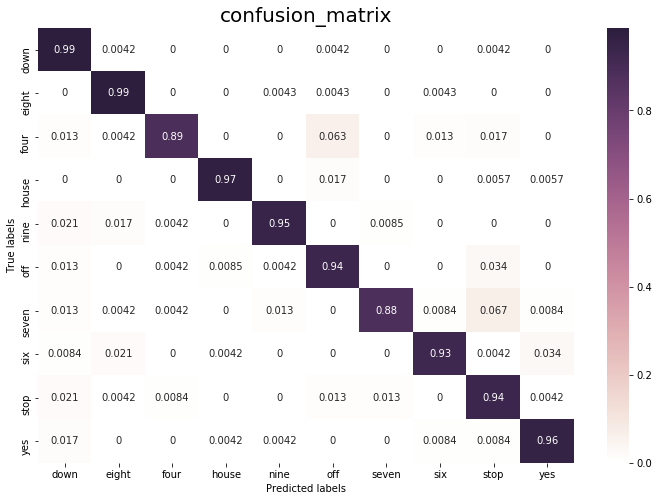

In [0]:
'''
testing - confusion matrix
'''

from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import normalize
import pandas as pd
import seaborn as sn

def show_confusion_matrix(pred, Y_TEST, lexic):
  
  encoder_mapping = dict(zip(lexic.classes_,lexic.transform(lexic.classes_)))
  
  cm = confusion_matrix(y_true=Y_TEST, y_pred=pred)
  cm = normalize(cm,axis=1,norm='l1')
  
  df_cm = pd.DataFrame(cm,
                      index=[i for i in encoder_mapping],
                      columns=[i for i in encoder_mapping])
  
  plt.figure(figsize=(12,8))
  
  cmap = sn.cubehelix_palette(light=1, as_cmap=True)
  sn.heatmap(df_cm, annot=True,cmap=cmap)
  plt.title('confusion_matrix',fontdict={'fontsize':20})
  plt.xlabel('Predicted labels')
  plt.ylabel('True labels')
  plt.show


  
pred = model_cnn.predict(X_test_mfcc_expanded, verbose=1)
pred = np.argmax(pred, axis=1)
show_confusion_matrix(pred, y_test, le)

# III. What about state of the art ? Introduction to more advanced techniques



## Short introduction to the Reccurent Neural Networks (RNN)

Traditional neural networks doesn't have **persistence** ; between each iterations, they throw away all the learned informations. Many problems have **sequential information** and it is therefore optimal to benefit from this sequentiality. Recurrent neural networks address this issue. They are networks with loops in them, allowing information to persist.

A recurrent neural network can be thought of as multiple copies of the same network, each passing a message to a successor.

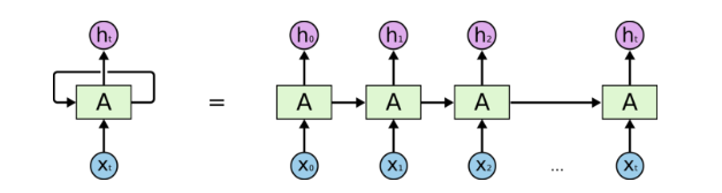

In [0]:
Image("google-speech-dataset/_lab_ressources_/rnn.png")



---


**Source** (For more details, we strongly invite you to read this excellent article!)

[introduction-to-recurrent-neural-networks](https://medium.com/explore-artificial-intelligence/an-introduction-to-recurrent-neural-networks-72c97bf0912)


---



## LSTM (Long Short-Term Memory) and GRU (Gated Recurrent Unit)

**RNN Short-term memory problem:**

*   Recurrent Neural Networks suffer from short-term memory. If a sequence is long enough, they’ll have a hard time carrying information from earlier time steps to later ones. So if you are trying to process a paragraph of text to do predictions, RNN’s may leave out important information from the beginning.

*  During back propagation, recurrent neural networks suffer from the vanishing gradient problem. Gradients are values used to update a neural networks weights. The vanishing gradient problem is when the gradient shrinks as it back propagates through time. If a gradient value becomes extremely small, it doesn’t contribute too much to the learning.

**As solution to short-term memory, LSTM and GRU were created:**

*   LSTM was introduced by this [article](https://www.bioinf.jku.at/publications/older/2604.pdf).
*   GRU was introduced by this [article](https://arxiv.org/pdf/1412.3555.pdf).

Both are **Reccurent Neural Network (RNN)** architectures which were created as the solution to short-term memory. They have internal mechanisms called gates that can regulate the flow of information. 









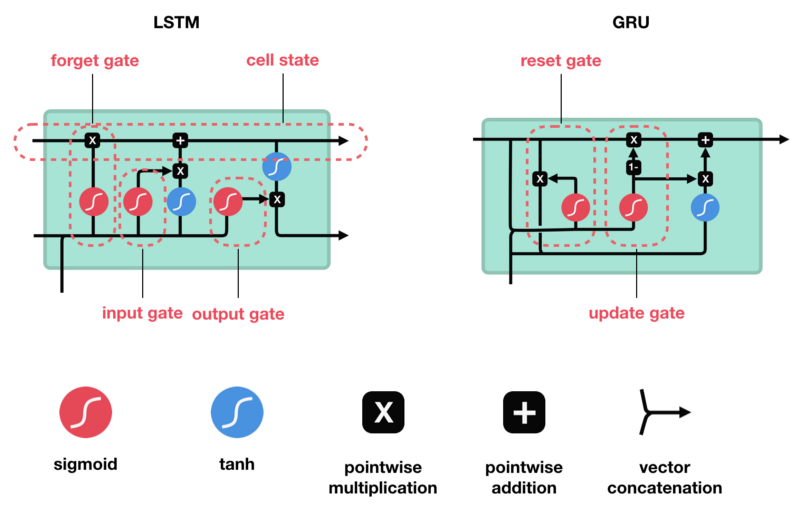

In [0]:
Image("google-speech-dataset/_lab_ressources_/lstm_gru.png")

These gates can learn which data in a sequence is important to keep or throw away. By doing that, it can pass relevant information down the long chain of sequences to make predictions.

**LSTM**

The LSTMs does have the ability to remove or add information to the cell state, carefully regulated by structures called gates.

*   the **cell state** make easy for the information to pass through the cell by combining the cells decisions
*   the **forget gate** decides what information should be thrown away from the cell state
*   the **input gate** decides which values we'll update using sigmoid ; it's combined with a tanh layer to create an update to the state
*   the **output gate**, based on the celle state, output a filtered information

**GRU**

The GRU is a modified version of the LSTM. It combines the forget and input gates into a single “update gate.” It also merges the cell state and hidden state, and makes some other changes. The resulting model is simpler than standard LSTM models, and has been growing increasingly popular.



**The following animation represents how the cells (for LSTM here) are fed sequentialy:**

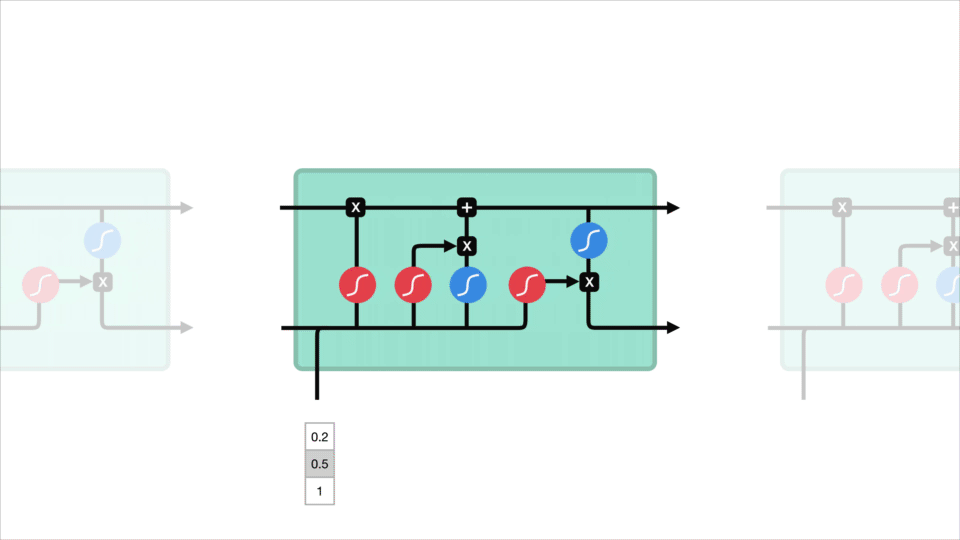

In [0]:
with open("google-speech-dataset/_lab_ressources_/lstm.gif",'rb') as f:
    display(Image(data=f.read(), format='png'))



---


**Source** (For more details, we strongly invite you to see these excellent articles!)

[illustrated-guide-to-lstms-and-gru](https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)

[Understanding-LSTMs](https://colah.github.io/posts/2015-08-Understanding-LSTMs/)



---



### Network composed of LSTM

To illustrate the above introduction, we will build a LSTM based neural network. The following architecture is a **Bidirectional Recurrent Neural Network (BRNN)**. It aims to connect two hidden layers of opposite directions to aggregate information from past (backward) and future (forward) states simultaneously.



---


**Reference:**
[BRNN](https://pdfs.semanticscholar.org/4b80/89bc9b49f84de43acc2eb8900035f7d492b2.pdf)


---



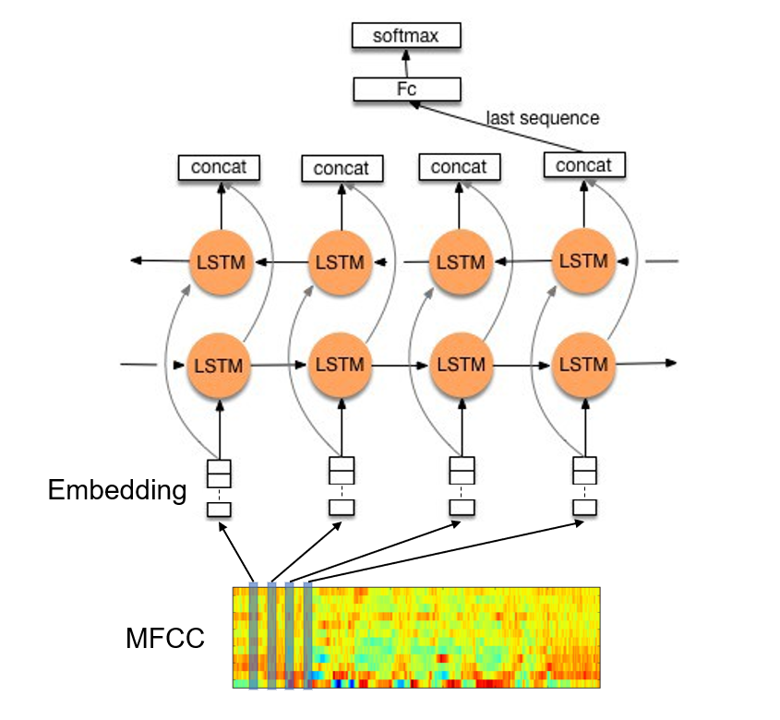

In [0]:
Image("google-speech-dataset/_lab_ressources_/mfcc_network.png")

**Warning!** **For this lab, we'll give the transposed MFCCs to the network in order to speed up the training. Indeed, the RNN are very long to train if they have to process a lot of time steps. Unfortunately, by transposing the MFCC matrices we won't learn from the temporal sequence but from the sequence of coefficients. As a result, this will reduce the performance of the models...**



We will use the keras sequential API.

In [0]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM

model_lstm = Sequential()
model_lstm.add(Bidirectional(LSTM(256,return_sequences=True),input_shape=(12,98)))
model_lstm.add(Bidirectional(LSTM(256)))
model_lstm.add(Dense(nb_classes,activation='softmax'))

model_lstm.compile(optimizer=Adam(lr=0.0003),loss='categorical_crossentropy',metrics=['accuracy'])

model_lstm.summary()

W0714 22:44:09.124518 140538355222400 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0714 22:44:09.126186 140538355222400 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:97: calling Orthogonal.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0714 22:44:09.127919 140538355222400 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:97: calling Zeros.__init__ (from tensorflow.python.ops.init_ops) with dtype is de

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional (Bidirectional (None, 12, 512)           727040    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 512)               1574912   
_________________________________________________________________
dense_9 (Dense)              (None, 10)                5130      
Total params: 2,307,082
Trainable params: 2,307,082
Non-trainable params: 0
_________________________________________________________________


As this type of model is very long to train, we will limit the number of epochs. 

In [0]:
history_lstm = model_lstm.fit(np.array(X_train_mfcc),y_train,validation_data = (np.array(X_val_mfcc), y_val),batch_size=32, epochs=10, shuffle=True)

Train on 18445 samples, validate on 2306 samples


W0714 22:44:10.503364 140538355222400 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/10
18445/18445 [==============================] - 54s 3ms/sample - loss: 1.1273 - acc: 0.6171 - val_loss: 0.6774 - val_acc: 0.7745
Epoch 2/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.4725 - acc: 0.8450 - val_loss: 0.5105 - val_acc: 0.8335
Epoch 3/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.2875 - acc: 0.9067 - val_loss: 0.4346 - val_acc: 0.8643
Epoch 4/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.1817 - acc: 0.9421 - val_loss: 0.4627 - val_acc: 0.8604
Epoch 5/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.1147 - acc: 0.9660 - val_loss: 0.4513 - val_acc: 0.8656
Epoch 6/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.0820 - acc: 0.9754 - val_loss: 0.4895 - val_acc: 0.8677
Epoch 7/10
18445/18445 [==============================] - 52s 3ms/sample - loss: 0.0561 - acc: 0.9834 - val_loss: 0.4974 - val_acc: 0.8664
Epoch 8/10
18445/18445 [===

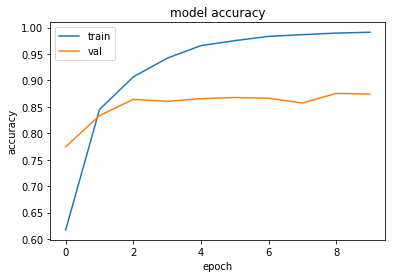

In [0]:
plot_history(history_lstm)

In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_lstm.evaluate(np.array(X_test_mfcc), np.eye(nb_classes,dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 3s 1ms/sample - loss: 0.5663 - acc: 0.8690
model accuracy: 0.8690373


2306/2306 [==============================] - 3s 1ms/sample


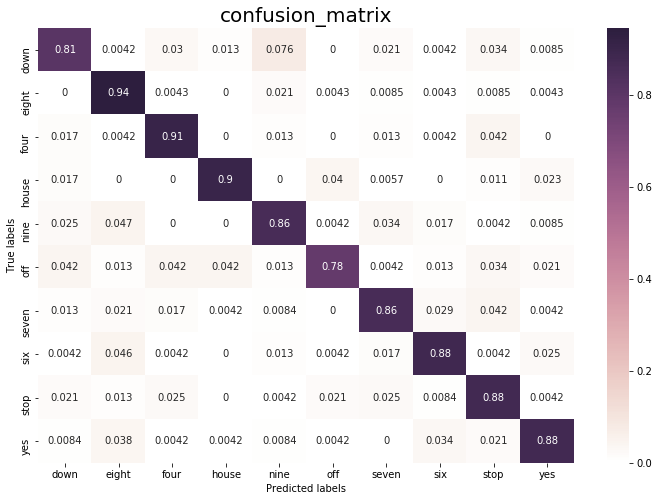

In [0]:
'''
testing - confusion matrix
'''

pred = model_lstm.predict(np.array(X_test_mfcc), verbose=1)
pred = np.argmax(pred, axis=1)
show_confusion_matrix(pred, y_test, le)

### Network composed of GRU

We will build a network using the same topology as for the LSTMs but with replacing the LSTM cells by GRU.

In [0]:
from tensorflow.keras.layers import GRU

model_gru = Sequential()
model_gru.add(Bidirectional(GRU(256,return_sequences=True),input_shape=(12,98)))
model_gru.add(Bidirectional(GRU(256)))
model_gru.add(Dense(nb_classes,activation='softmax'))

model_gru.compile(optimizer=Adam(lr=0.0003),loss='categorical_crossentropy',metrics=['accuracy'])

model_gru.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_2 (Bidirection (None, 12, 512)           545280    
_________________________________________________________________
bidirectional_3 (Bidirection (None, 512)               1181184   
_________________________________________________________________
dense_10 (Dense)             (None, 10)                5130      
Total params: 1,731,594
Trainable params: 1,731,594
Non-trainable params: 0
_________________________________________________________________


In [0]:
history_gru = model_gru.fit(np.array(X_train_mfcc),y_train,validation_data = (np.array(X_val_mfcc), y_val),batch_size=32, epochs=10, shuffle=True)

Train on 18445 samples, validate on 2306 samples
Epoch 1/10
18445/18445 [==============================] - 47s 3ms/sample - loss: 0.9939 - acc: 0.6724 - val_loss: 0.5585 - val_acc: 0.8265
Epoch 2/10
18445/18445 [==============================] - 45s 2ms/sample - loss: 0.3833 - acc: 0.8797 - val_loss: 0.4312 - val_acc: 0.8643
Epoch 3/10
18445/18445 [==============================] - 45s 2ms/sample - loss: 0.2185 - acc: 0.9342 - val_loss: 0.3899 - val_acc: 0.8790
Epoch 4/10
18445/18445 [==============================] - 44s 2ms/sample - loss: 0.1280 - acc: 0.9631 - val_loss: 0.3750 - val_acc: 0.8786
Epoch 5/10
18445/18445 [==============================] - 45s 2ms/sample - loss: 0.0711 - acc: 0.9788 - val_loss: 0.4153 - val_acc: 0.8868
Epoch 6/10
18445/18445 [==============================] - 44s 2ms/sample - loss: 0.0434 - acc: 0.9894 - val_loss: 0.4098 - val_acc: 0.8868
Epoch 7/10
18445/18445 [==============================] - 45s 2ms/sample - loss: 0.0264 - acc: 0.9943 - val_loss: 0.4

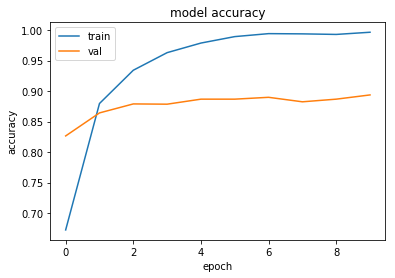

In [0]:
plot_history(history_gru)

In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_gru.evaluate(np.array(X_test_mfcc), np.eye(nb_classes,dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 2s 1ms/sample - loss: 0.5312 - acc: 0.8816
model accuracy: 0.8816132


2306/2306 [==============================] - 3s 1ms/sample


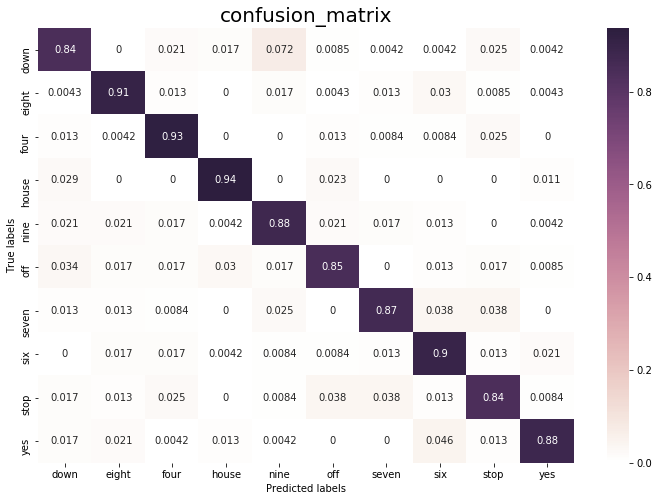

In [0]:
'''
testing - confusion matrix
'''

pred = model_gru.predict(np.array(X_test_mfcc), verbose=1)
pred = np.argmax(pred, axis=1)
show_confusion_matrix(pred, y_test, le)

## Attention mechanism

Attention mechanism for sequence modelling was first introduced in [this](https://arxiv.org/pdf/1409.0473.pdf), but really caught the attention of the community with the famous article "[Attention Is All You Need](https://arxiv.org/pdf/1706.03762.pdf)".

The main assumption in sequence modelling networks such as RNNs, LSTMs and GRUs is that the current state holds information for the whole of input seen so far. Hence the final state of a RNN after reading the whole input sequence should contain complete information about that sequence. This seems to be too strong a condition and too much to ask.

Attention mechanism relax this assumption and proposes that we should look at the hidden states corresponding to the whole input sequence in order to make any prediction.




---


**Sources** (For more details, we strongly invite you to see these excellent articles!)

[understanding-attention-mechanism](https://medium.com/@shashank7.iitd/understanding-attention-mechanism-35ff53fc328e)

[attention-based-models](https://krntneja.github.io/blog/2018/06/02/attention-based-models-1)


---




In [0]:
from keras.layers import concatenate, dot, Bidirectional
from keras.layers.core import *
from keras.layers.recurrent import LSTM
from keras.models import *


INPUT_DIM = 98
TIME_STEPS = 12

# if True, the attention vector is shared across the input_dimensions where the attention is applied.
SINGLE_ATTENTION_VECTOR = True
APPLY_ATTENTION_BEFORE_LSTM = False

def attention_3d_block(hidden_states):
  
  
    # hidden_states.shape = (batch_size, time_steps, hidden_size)
    hidden_size = int(hidden_states.shape[2])
    
    
    
    # Inside dense layer
    #              hidden_states            dot               W            =>           score_first_part
    # (batch_size, time_steps, hidden_size) dot (hidden_size, hidden_size) => (batch_size, time_steps, hidden_size)
    # W is the trainable weight matrix of attention
    # Luong's multiplicative style score
    score_first_part = Dense(hidden_size, use_bias=False, name='attention_score_vec')(hidden_states)
    
    
    #            score_first_part           dot        last_hidden_state     => attention_weights
    # (batch_size, time_steps, hidden_size) dot   (batch_size, hidden_size)  => (batch_size, time_steps)
    h_t = Lambda(lambda x: x[:, -1, :], output_shape=(hidden_size,), name='last_hidden_state')(
        hidden_states)
    score = dot([score_first_part, h_t], [2, 1], name='attention_score')
    attention_weights = Activation('softmax', name='attention_weight')(score)
    
    
    
    # (batch_size, time_steps, hidden_size) dot (batch_size, time_steps) => (batch_size, hidden_size)
    context_vector = dot([hidden_states, attention_weights], [1, 1], name='context_vector')
    
    
    pre_activation = concatenate([context_vector, h_t], name='attention_output')
    attention_vector = Dense(128, use_bias=False, activation='tanh', name='attention_vector')(
        pre_activation)
    return attention_vector
  
  
def model_attention_applied_after_lstm():
  inputs = Input(shape=(TIME_STEPS, INPUT_DIM,))
  lstm_out = Bidirectional(LSTM(100, return_sequences=True))(inputs)
  lstm_out = Bidirectional(LSTM(100, return_sequences=True))(lstm_out)
  attention_mul = attention_3d_block(lstm_out)

  output = Dense(nb_classes, activation='softmax', name='output')(attention_mul)
  model = Model(input=[inputs], output=output)
  return model




model_attention = model_attention_applied_after_lstm()

model_attention.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_attention.summary()

Using TensorFlow backend.
W0714 23:00:40.603253 140538355222400 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0714 23:00:40.604260 140538355222400 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0714 23:00:40.614782 140538355222400 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:56: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("ou...)`
W0714 23:00:41.692557 140538355222400 deprecation_wrapper.py:119] From /usr/local/

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 12, 98)       0                                            
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 12, 200)      159200      input_1[0][0]                    
__________________________________________________________________________________________________
bidirectional_2 (Bidirectional) (None, 12, 200)      240800      bidirectional_1[0][0]            
__________________________________________________________________________________________________
attention_score_vec (Dense)     (None, 12, 200)      40000       bidirectional_2[0][0]            
__________________________________________________________________________________________________
last_hidde

In [0]:
history_attention = model_attention.fit(np.array(X_train_mfcc),y_train,validation_data = (np.array(X_val_mfcc), y_val),batch_size=32, epochs=10, shuffle=True)

W0714 23:00:44.460915 140538355222400 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.



Train on 18445 samples, validate on 2306 samples
Epoch 1/10
18445/18445 [==============================] - 52s 3ms/step - loss: 1.2171 - acc: 0.5734 - val_loss: 0.7932 - val_acc: 0.7303
Epoch 2/10
18445/18445 [==============================] - 48s 3ms/step - loss: 0.6004 - acc: 0.7992 - val_loss: 0.5890 - val_acc: 0.8049
Epoch 3/10
18445/18445 [==============================] - 48s 3ms/step - loss: 0.4104 - acc: 0.8645 - val_loss: 0.5401 - val_acc: 0.8287
Epoch 4/10
18445/18445 [==============================] - 48s 3ms/step - loss: 0.2979 - acc: 0.8998 - val_loss: 0.5318 - val_acc: 0.8330
Epoch 5/10
18445/18445 [==============================] - 48s 3ms/step - loss: 0.2174 - acc: 0.9274 - val_loss: 0.5343 - val_acc: 0.8435
Epoch 6/10
18445/18445 [==============================] - 48s 3ms/step - loss: 0.1699 - acc: 0.9436 - val_loss: 0.5550 - val_acc: 0.8504
Epoch 7/10
18445/18445 [==============================] - 47s 3ms/step - loss: 0.1449 - acc: 0.9516 - val_loss: 0.5657 - val_acc:

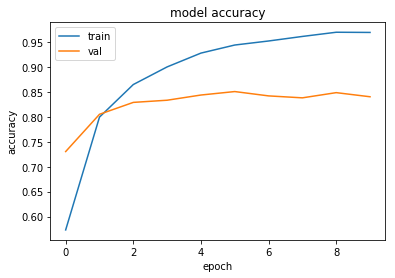

In [0]:
plot_history(history_attention)

In [0]:
'''
testing - accuracy
'''

loss, accuracy = model_attention.evaluate(np.array(X_test_mfcc), np.eye(len(chosen_classes),dtype='uint8')[y_test],verbose = 1)

print('model accuracy:',accuracy)

2306/2306 [==============================] - 2s 1ms/step
model accuracy: 0.8477883781439722


2306/2306 [==============================] - 3s 1ms/step


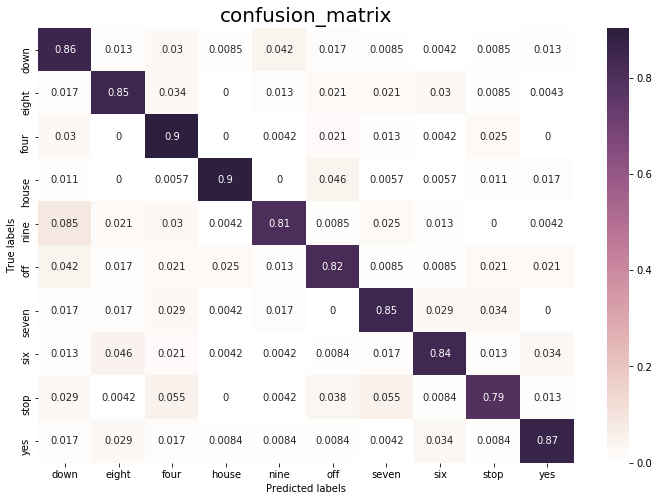

In [0]:
'''
testing - confusion matrix
'''

pred = model_attention.predict(np.array(X_test_mfcc), verbose=1)
pred = np.argmax(pred, axis=1)
show_confusion_matrix(pred, y_test, le)

# IV. To go further: let's get noisy!

Our previous results are satisfactory; however, what we've done before are toy examples. 
Now, we will complicate the problem so that it is closer to real use cases:

We will **add noise** to our audio samples as we want our model to work in a potentially noisy environment. This process is called "**data augmentation**": in the real world scenario, we may have a dataset of audio taken in a limited set of conditions. But, our target application may exist in a variety of conditions. We want to give the network the ability to ignore noise.


We will now mix one signal with noise and understand the concept of SNR.

In [0]:
def normalize(audio_signal):
  
  return np.array(audio_signal)/max(np.absolute(audio_signal))

def add_padding(audio_signal,desired_len):
  
  length_signal = len(audio_signal)
  if length_signal < desired_len:
    zeros = list(np.zeros(desired_len - length_signal))
    cut = random.randint(0, len(zeros))
    left = zeros[:cut]
    right = zeros[cut:]

    audio_signal = left + list(audio_signal) + right
  
  return audio_signal

def get_signal(path):
  
  rate, sig = wavfile.read(filename=path)
  
  try:
    sig = sig[:, 0]
    
  except:
    pass
  
  
  #normalization
  sig = normalize(sig)

  #standardization
  sig = add_padding(sig,16000)
  
  return sig

Let's consider two different signals, one spoken word from the dataset and one noise profile to overlay to it. By executing the following cell you can see the waveform of this two signals.

100%|██████████| 5/5 [00:07<00:00,  1.03it/s]


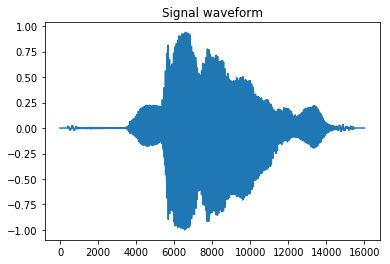

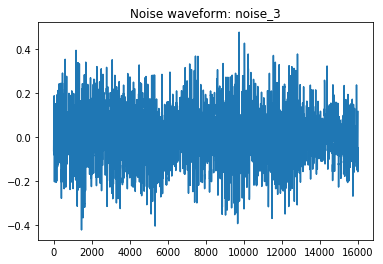

In [0]:
#add plot of the noise itself

noise_path = glob.glob('google-speech-dataset/_background_noise_/*wav')


noise_lib = [get_signal(p) for p in tqdm(noise_path, position=0)]



#print(noise_path)
# noise = random.choice(noise_path)
noise = noise_path[0]
noise_wav = get_signal(noise)

#waveform signal
plt.figure()
signal = (X_train_waveform[0])
plt.plot(signal)
plt.title("Signal waveform")

#waveform noise
plt.figure()
n_name = noise.split('/')[-1].split('.wav')[0]
cut = random.randint(0, len(noise_wav))
plt.plot(noise_wav[cut:cut+16000])
plt.title(f"Noise waveform: {n_name}")
plt.show()


At this point, before the mixing we need a way to measure the amount of noise to add to the original signal. We want to control the loudness and of the noisy signal to understand how the performance of the classification are evolving for different levels of noise. 

The measure used to monitor the level of noise to add, or remove, from the signal is the **Signal to
Noise Ratio (SNR)**. This is a measure used in science and engineering that compares the level of a
desired signal to the level of background noise. SNR is defined as the ratio of signal power to the
noise power, often expressed in decibels. A ratio higher than 1:1 (greater than 0 dB) indicates more
signal than noise. Signal-to-noise ratio is defined as the ratio of the power of a signal (meaningful
information) to the power of background noise (unwanted signal):. 

$SNR = \frac{P_{signal}}{S_{noise}}$


Both signal and noise power must be measured at the same or equivalent points in a system, and within the same system bandwidth.
Because many signals have a very wide dynamic range, signals are often expressed using the logarithmic decibel scale. Based upon the definition of decibel, signal and noise may be expressed in decibels (dB) as:

$P_{signal, dB} = 10 log_{10}(P_{signal})$ 

where P is average power. 

In [0]:
def cal_adjusted_rms(clean_rms, snr):
    a = float(snr) / 20
    noise_rms = clean_rms / (10 ** a)
    return noise_rms
  

def cal_rms(amp):
    return np.sqrt(np.mean(np.square(amp), axis=-1))

In [0]:
def add_noise(signal, noise, snr):
    '''
    signal: np.ndarray
    snr: signed integer

    returns -> np.ndarray
    '''

    index = random.randint(0, len(noise) - len(signal))
    noise = noise[index:index+len(signal)]

    clean_rms = cal_rms(signal)

    # take part of noise and:
    noise_rms = cal_rms(noise)

    #noise amplitude
    adjusted_noise_rms = cal_adjusted_rms(clean_rms, snr)

    adjusted_noise_amp = noise * (adjusted_noise_rms / noise_rms)
    mixed_amp = (signal + adjusted_noise_amp)

    max_int16 = np.iinfo(np.int16).max
    if mixed_amp.max(axis=0) > max_int16:
        reduction_rate = max_int16 / mixed_amp.max(axis=0)
        mixed_amp = mixed_amp * (reduction_rate)

    return mixed_amp/ max(np.absolute(mixed_amp))

Try now to mix the two sounds at different SNR levels by changing the value **snr** below. Remember that the lower this value, the more noisy the mixing will be. You can also play the audio to have a direct feedback.

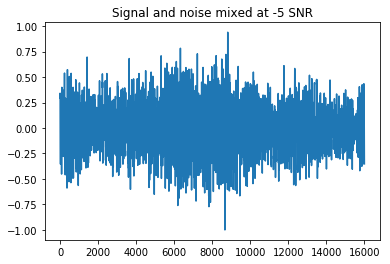

In [0]:
snr = -5

mixed = add_noise(signal, noise_wav, snr)

#waveform noise
plt.figure()
plt.plot(mixed)
plt.title(f"Signal and noise mixed at {snr} SNR")
plt.show()
mixed = (mixed*32767).astype(np.int16) 
wavfile.write('google-speech-dataset/mixed.wav', 16000, mixed)
Audio('google-speech-dataset/mixed.wav')

With this in mind we can augment our dataset and try to make our model more robust to noise. To do so, we are selecting randomly one noise profile from our library and mixing it to one of the files from the dataset at a random level of SNR in the range from -5 to +20. This means that our augumented dataset will have twice the audio files of the clean version.

In [0]:
snr = np.arange(-5,+20)
def augment_data(signal, snr_range=snr):

  noise = random.choice(noise_lib)
  snr = random.choice(snr_range)
    
  mixed = add_noise(signal, noise, snr)
    
  return mixed

Of course, it is necessary to apply the same process also to the validation and test set otherwise we could not appreciate the different behaviour of the network in testing phase.

In [0]:
'''
adding noise
'''

X_train_aug = [augment_data(signal) for signal in tqdm(X_train_waveform,position=0)]
X_test_aug = [augment_data(signal) for signal in tqdm(X_test_waveform,position=0)]
X_val_aug = [augment_data(signal) for signal in tqdm(X_val_waveform,position=0)]


'''
'get mfcc features'
'''
X_train_noisy_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_train_aug,position=0)]
X_test_noisy_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_test_aug,position=0)]
X_val_noisy_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_val_aug,position=0)]


'''
get augmented dataset with clean and noisy data
'''
X_train_noisy = X_train_noisy_mfcc + X_train_mfcc
X_test_noisy = X_test_noisy_mfcc + X_test_mfcc
X_val_noisy = X_val_noisy_mfcc + X_val_mfcc


print('X_train_noisy:',len(X_train_noisy))
print('X_val_noisy:',len(X_val_noisy))
print('X_test_noisy:',len(X_test_noisy))


'''
labels
'''

y_train_noisy = np.array(list(y_train) + list(y_train))
y_val_noisy = np.array(list(y_val) + list(y_val))


print("y_train_noisy:",len(y_train_noisy))
print("y_val_noisy:",len(y_val_noisy))

100%|██████████| 2306/2306 [00:03<00:00, 668.42it/s]


X_train_noisy: 36890
X_val_noisy: 4612
X_test_noisy: 4612
y_train_noisy: 36890
y_val_noisy: 4612


In [0]:
X_test_noisy_mfcc_expanded = np.expand_dims(X_test_noisy_mfcc, axis=-1)
print('test tensor shape:',X_test_noisy_mfcc_expanded.shape)

test tensor shape: (2306, 12, 98, 1)


Time to do some testing! Let's see how the CNN we have trained before is performing with this now dataset of augumented data. 

100%|██████████| 2306/2306 [00:03<00:00, 653.84it/s]


SNR: -15  - acc:  0.3057242


100%|██████████| 2306/2306 [00:03<00:00, 671.03it/s]


SNR: -10  - acc:  0.45880312


100%|██████████| 2306/2306 [00:03<00:00, 648.24it/s]


SNR: -5  - acc:  0.613183


100%|██████████| 2306/2306 [00:03<00:00, 630.13it/s]


SNR: 0  - acc:  0.74978316


100%|██████████| 2306/2306 [00:03<00:00, 647.68it/s]


SNR: 5  - acc:  0.84431916


100%|██████████| 2306/2306 [00:03<00:00, 645.11it/s]


SNR: 10  - acc:  0.896791


100%|██████████| 2306/2306 [00:03<00:00, 659.44it/s]


SNR: 15  - acc:  0.9223764


100%|██████████| 2306/2306 [00:03<00:00, 659.86it/s]


SNR: 20  - acc:  0.93668693


100%|██████████| 2306/2306 [00:03<00:00, 670.22it/s]


SNR: 25  - acc:  0.94492626


100%|██████████| 2306/2306 [00:03<00:00, 671.26it/s]


SNR: 30  - acc:  0.9466609


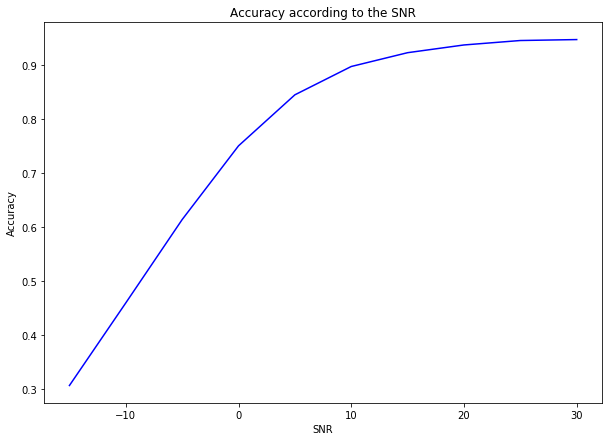

In [0]:
def accuracy_by_SNR(MODEL, TEST_WAVEFORMS = X_test_waveform, LABELS = y_test,MIN_SNR=-15,MAX_SNR=30,SNR_STEP=5):
  
  SNRs = list(range(MIN_SNR,MAX_SNR+1,)[0::SNR_STEP])
  
  ###
  acc = []
  for SNR in SNRs:
    
    X_noisy_SNR = []
    
    for SIGNAL in TEST_WAVEFORMS:
      
      NOISE = random.choice(noise_lib)
      X_noisy_SNR.append(add_noise(SIGNAL, NOISE, SNR))
    
    X_noisy_SNR_mfcc = [get_mfcc_from_signal(signal) for signal in tqdm(X_noisy_SNR,position=0)]
    X_noisy_SNR_mfcc_expanded = np.expand_dims(X_noisy_SNR_mfcc, axis=-1)  
    
  
    loss, accuracy = MODEL.evaluate(X_noisy_SNR_mfcc_expanded, np.eye(len(chosen_classes),dtype='uint8')[y_test],verbose=0)
    
    print('SNR:',SNR," - acc: ", accuracy)
    acc.append(accuracy)
    
  return acc, SNRs  
  
acc_without_DA, snrs = accuracy_by_SNR(model_cnn)

plt.figure(figsize=(10,7))
plt.plot(snrs,acc_without_DA,color='blue')
plt.title("Accuracy according to the SNR")
plt.xlabel("SNR")
plt.ylabel("Accuracy")

plt.show()

Now let's train from the beginning a new CNN with the same structure as the one seen before, but using the augumented data. 

In [0]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model

model_cnn_noisy = CNN()
model_cnn_noisy.compile(loss='categorical_crossentropy',
              optimizer = Adam(lr=0.003),metrics=['accuracy'])

In [0]:
X_train_noisy_expanded = np.expand_dims(X_train_noisy, axis=-1)
X_val_noisy_expanded = np.expand_dims(X_val_noisy, axis=-1)


history_cnn_noisy = model_cnn_noisy.fit(X_train_noisy_expanded,y_train_noisy,validation_data = (X_val_noisy_expanded, y_val_noisy),batch_size=32, epochs=10, shuffle=True)

Train on 36890 samples, validate on 4612 samples
Epoch 1/10
36890/36890 [==============================] - 9s 255us/sample - loss: 1.0835 - acc: 0.6269 - val_loss: 0.5951 - val_acc: 0.8153
Epoch 2/10
36890/36890 [==============================] - 8s 220us/sample - loss: 0.4318 - acc: 0.8617 - val_loss: 0.3076 - val_acc: 0.9048
Epoch 3/10
36890/36890 [==============================] - 8s 220us/sample - loss: 0.3102 - acc: 0.9025 - val_loss: 0.2765 - val_acc: 0.9137
Epoch 4/10
36890/36890 [==============================] - 8s 219us/sample - loss: 0.2489 - acc: 0.9213 - val_loss: 0.2380 - val_acc: 0.9228
Epoch 5/10
36890/36890 [==============================] - 8s 220us/sample - loss: 0.2118 - acc: 0.9337 - val_loss: 0.2580 - val_acc: 0.9196
Epoch 6/10
36890/36890 [==============================] - 8s 220us/sample - loss: 0.1824 - acc: 0.9422 - val_loss: 0.2428 - val_acc: 0.9250
Epoch 7/10
36890/36890 [==============================] - 8s 220us/sample - loss: 0.1590 - acc: 0.9504 - val_lo

100%|██████████| 2242/2242 [00:04<00:00, 493.00it/s]


SNR: -15  - acc:  0.41347012


100%|██████████| 2242/2242 [00:04<00:00, 534.74it/s]


SNR: -10  - acc:  0.55619985


100%|██████████| 2242/2242 [00:04<00:00, 538.63it/s]


SNR: -5  - acc:  0.7172168


100%|██████████| 2242/2242 [00:04<00:00, 539.68it/s]


SNR: 0  - acc:  0.8202498


100%|██████████| 2242/2242 [00:04<00:00, 557.66it/s]


SNR: 5  - acc:  0.88135594


100%|██████████| 2242/2242 [00:04<00:00, 536.58it/s]


SNR: 10  - acc:  0.91257805


100%|██████████| 2242/2242 [00:04<00:00, 536.35it/s]


SNR: 15  - acc:  0.9250669


100%|██████████| 2242/2242 [00:04<00:00, 534.66it/s]


SNR: 20  - acc:  0.9339875


100%|██████████| 2242/2242 [00:04<00:00, 551.47it/s]


SNR: 25  - acc:  0.9335415


100%|██████████| 2242/2242 [00:03<00:00, 565.92it/s]


SNR: 30  - acc:  0.93309546


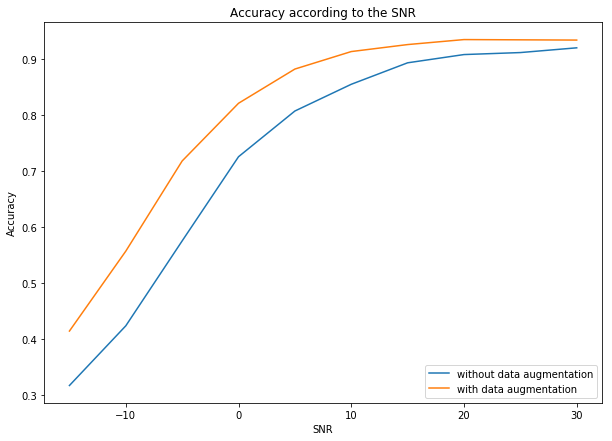

In [0]:
acc_with_DA, snrs = accuracy_by_SNR(model_cnn_noisy)

plt.figure(figsize=(10,7))
plt.plot(snrs,acc_without_DA)
plt.plot(snrs,acc_with_DA)
plt.title("Accuracy according to the SNR")
plt.xlabel("SNR")
plt.ylabel("Accuracy")
plt.legend(['without data augmentation', 'with data augmentation'], loc='lower right')

plt.show()

We have better performances using data augmentation as the model was trained in noisy conditions.

# Now it's your turn!

Companies working in deep learning want their models to be able to recognize commands among any sample, even those that the model has never seen during training. We call that an **open set problem**.

We must make the model understand that it must learn to generalize a "bin" class which includes all sounds that are not commands that must recognize the model.

Let's say all the classes we did not select as commands at the beginning are the ones we will use to create a "bin class". So, we will label all of them as "BIN".



---

**WARNING! If you aleady compile the code above, you may not have enough RAM to compile the following code.**

Please reset all runtime before starting it:

- Click on "Runtime"
- Reset all runtimes


---

As we reseted the runtimes, we need to compile again some code first:

In [0]:
'''
the dataset, stored on gitlab, can be imported using one line (~2 minutes)
'''

! git clone https://gitlab.com/baptiste.pouthier/google-speech-dataset.git
  
  
'''
install library which is not already installed
'''
!pip install sonopy


'''
used libraries
'''
from IPython.display import Audio, Image
import os
import glob
import random
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy as np
from tqdm  import tqdm
from sonopy import mfcc_spec
from scipy.io import wavfile


root_path = 'google-speech-dataset'
all_classes = os.listdir(root_path)
all_classes.remove('.git')
all_classes.remove('bird') #some outliers in dataset
all_classes.remove('_lab_ressources_')
all_classes.remove('_background_noise_')
print('all available classes:\n',all_classes)


nb_classes = 10

chosen_classes = random.sample(all_classes, nb_classes)
print('chosen classes:',chosen_classes)


X = []
for label in chosen_classes:
  path = root_path+'/'+label
  X.extend(glob.glob(os.path.join(path, '*.wav')))
  
  
y = [path.split('/')[-2] for path in X]


'''
change string labels into numbers
'''

le = preprocessing.LabelEncoder()
le.fit(y)
y = le.transform(y)


def normalize(audio_signal):
  
  return np.array(audio_signal)/max(np.absolute(audio_signal))

def add_padding(audio_signal,desired_len):
  
  length_signal = len(audio_signal)
  if length_signal < desired_len:
    zeros = list(np.zeros(desired_len - length_signal))
    cut = random.randint(0, len(zeros))
    left = zeros[:cut]
    right = zeros[cut:]

    audio_signal = left + list(audio_signal) + right
  
  return audio_signal

def get_signal(path):
  
  rate, sig = wavfile.read(filename=path)
  
  try:
    sig = sig[:, 0]
    
  except:
    pass
  
  
  #normalization
  sig = normalize(sig)

  #standardization
  sig = add_padding(sig,16000)
  
  return sig


def get_mfcc_from_signal(signal):

  #extract MFCCs features
  single_mfcc = mfcc_spec(signal, 16000, window_stride=(400, 160), fft_size=512, num_filt=20, num_coeffs=13).T

  #dropping first coefficient
  single_mfcc = single_mfcc[1:,:] #keeping only 12 coefficients

  return single_mfcc

Cloning into 'google-speech-dataset'...
remote: Enumerating objects: 64491, done.
remote: Counting objects: 100% (64491/64491), done.
remote: Compressing objects: 100% (64303/64303), done.
remote: Total 64491 (delta 209), reused 64448 (delta 187)
Receiving objects: 100% (64491/64491), 1.51 GiB | 21.50 MiB/s, done.
Resolving deltas: 100% (209/209), done.
Checking out files: 100% (64751/64751), done.
  Stored in directory: /root/.cache/pip/wheels/b6/39/ba/b2f21d4fbcb362658c73f83c9502782300b0399aef3693b506
Successfully built sonopy
all available classes:
 ['wow', 'go', 'left', 'seven', 'three', 'zero', 'right', 'no', 'yes', 'bed', 'six', 'dog', 'off', 'stop', 'five', 'up', 'cat', 'marvin', 'happy', 'house', 'tree', 'nine', 'four', 'sheila', 'one', 'down', 'eight', 'on', 'two']
chosen classes: ['on', 'down', 'off', 'eight', 'sheila', 'seven', 'no', 'two', 'stop', 'marvin']


In [0]:
bin_classes = list(set(all_classes) - set(chosen_classes))

print("commands:",chosen_classes)
print("bin classes:",bin_classes)

commands: ['on', 'down', 'off', 'eight', 'sheila', 'seven', 'no', 'two', 'stop', 'marvin']
bin classes: ['wow', 'go', 'house', 'right', 'tree', 'six', 'yes', 'five', 'dog', 'four', 'three', 'nine', 'up', 'happy', 'one', 'bed', 'left', 'zero', 'cat']


In [0]:
X_BIN = []

for label in bin_classes:
  path = root_path+'/'+label
  X_BIN.extend(glob.glob(os.path.join(path, '*.wav')))
  
  
y_BIN = ["BIN"]*len(X_BIN)

In [0]:
'''
get the new data inside our array of samples / labels
'''

X_openset = X+X_BIN
y_openset = list(le.inverse_transform(y))+y_BIN


print("number of samples:",len(X_openset))
print("number of labels:",len(y_openset))


'''
transform our new labels into numbers
'''

le_openset = preprocessing.LabelEncoder()
le_openset.fit(y_openset)
y_openset = le_openset.transform(y_openset)


'''
split in train / test / val
'''

X_train_OS, X_test_OS, y_train_OS, y_test_OS = train_test_split(X_openset ,y_openset , test_size=0.2, stratify=y_openset)
X_test_OS, X_val_OS, y_test_OS, y_val_OS = train_test_split(X_test_OS, y_test_OS, test_size=0.5, stratify=y_test_OS)


print('training samples:',len(X_train_OS))
print('testing samples:',len(X_test_OS))
print('validation samples:',len(X_val_OS))


'''
extract all the numerical arrays from the .wav files
'''
X_train_waveform_OS = [get_signal(path) for path in tqdm(X_train_OS,position=0)]
X_test_waveform_OS = [get_signal(path) for path in tqdm(X_test_OS,position=0)]
X_val_waveform_OS = [get_signal(path) for path in tqdm(X_val_OS,position=0)]


'''
get MFCCs features from the numerical arrays
'''
X_train_mfcc_OS = [get_mfcc_from_signal(signal) for signal in tqdm(X_train_waveform_OS,position=0)]
X_test_mfcc_OS = [get_mfcc_from_signal(signal) for signal in tqdm(X_test_waveform_OS,position=0)]
X_val_mfcc_OS = [get_mfcc_from_signal(signal) for signal in tqdm(X_val_waveform_OS,position=0)]

  0%|          | 57/50392 [00:00<01:29, 562.15it/s]

number of samples: 62990
number of labels: 62990
training samples: 50392
testing samples: 6299
validation samples: 6299


100%|██████████| 6299/6299 [00:12<00:00, 489.18it/s]


In [0]:
X_train_mfcc_OS_expanded = np.expand_dims(X_train_mfcc_OS, axis=-1)


X_val_mfcc_OS_expanded = np.expand_dims(X_val_mfcc_OS, axis=-1)


X_test_mfcc_OS_expanded = np.expand_dims(X_test_mfcc_OS, axis=-1)



nb_classes = len(chosen_classes)+1 


y_train_OS = np.eye(nb_classes,dtype='uint8')[y_train_OS]

y_val_OS = np.eye(nb_classes,dtype='uint8')[y_val_OS]

**The data is ready, now you have to build your network! Feel free to use the CNN we built!**

In [0]:
'''
your code here!
'''